In [7]:
# import all the necessary libraries
# import basic libraries
import numpy as np
import pandas as pd
import math
%matplotlib inline
import matplotlib.pyplot as plt
import statsmodels.api as sm

# import basic libraries for time series analysis
from statsmodels.tsa.statespace.tools import diff
from sklearn.metrics import mean_squared_error , mean_absolute_error
from statsmodels.tools.eval_measures import rmse
from statsmodels.tsa.stattools import acovf, acf, pacf, pacf_yw,pacf_ols
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import lag_plot
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima
from statsmodels.tsa.stattools import adfuller

# import models
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.ar_model import AR,ARResults #AR model
from statsmodels.tsa.arima_model import ARMA, ARIMA, ARMAResults, ARIMAResults #ARIMAモデル
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX, VARMAXResults

# import advanced methods of time series analysis
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.stats.stattools import durbin_watson

# Ignore harmless warning
import warnings
warnings.filterwarnings("ignore")

In [24]:
# Here, I writes functions based on lectures and courses.


from statsmodels.tsa.stattools import adfuller
def adf_test(series, title = ""):
    """
    if you input series, the p-value of Augmented Dickey-Fuller test is returned.
    """
    print(f"Augumented Dickey-Fuller Test:{title}")
    result = adfuller(series.dropna(),autolag = "AIC") # .dropna() handles differenced data
    labels = ["ADS test statistic", "p-value", "# lags used", "# observations"] # # stands for number
    out = pd.Series(result[0:4],index = labels)

    for key, val in result[4].items():
        out[f"Critical Value ({key})"] = val
    print(out.to_string()) # .to_string() omit "dtype:float64"

    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")
    return result[1]

#Create functions to implement ADF test and plots the output

def plot_series(series, figsize = (9,6), title = "", model = "add"):
    """
    Plot seasonal factors of series
    """
    season = seasonal_decompose(series,model = model)
    season.plot();

def plot_property(series, title = "", num = 30):
    """
    Plot the date and its lag-1 data as well as ACF and PACF
    """
    lag_plot(series)
    plot_acf(series,lags = num, title = f"{title} ACF")
    plot_pacf(series,lags = num,title = f"{title} PACF")


def all_plot(data, title = "", figsize = (12,9),model = "add", season = False, acf = False ,num = 30,col = 2):
    """
    Plot all the input data one by one. 
    At the same time, you can choose to produce ACF and PACF
    """
    columns = data.columns
    fig, axes = plt.subplots(nrows= math.ceil(len(columns)/col), ncols=col, dpi=120, figsize=figsize)
    for i, ax in enumerate(axes.flatten()):
        if i <= len(columns)-1:
            df = data[data.columns[i]]
            ax.plot(df, linewidth=1)
            ax.set_title(data.columns[i])
            ax.xaxis.set_ticks_position('none')
            ax.yaxis.set_ticks_position('none')
            ax.spines["top"].set_alpha(0)
            ax.tick_params(labelsize=6)
            plt.subplots_adjust(hspace=0.6)
    for column in columns:
        if season == True:
            plot_series(data[column],title = column, model = model,figsize = figsize)
        if acf == True:
            plot_property(data[column], title = column, num = num)



def auto_adf(data):
    """
    This functions shows how many times the series need to be differenced.
    However, one difference seems better in general, or you can omit the data.
    ---------
    num_dic shows how many times the series need to be differenced
    """
    num = len(data.columns)
    num_dic = {}
    for x in range(num):
        result = adf_test(data.iloc[:,x])
        diff_num = 0
        series = data.iloc[:,x].diff()
        while result > 0.05:
            result = adf_test(series)
            series = series.diff()
            diff_num = diff_num + 1
        print(f"{data.columns[x]} needs {diff_num} times difference to obtain stationary")
        num_dic[data.columns[x]] = diff_num
        print("--------------------------------")
    return num_dic

#diffを行う回数分差分を取り，それを再びデータとして加える．
def differencing_data(data):
    """
    This function combines with auto_diff function
    so that this function can automatically difference data as it requires,
    and return another data frame as an output.
    """
    #make a new data frame, which requires the same index of the original data
    idx = pd.date_range(data.index[0],periods = len(data.index),freq = data.index.freq)
    new_data = pd.DataFrame(index = idx)
    # Get the output of the function as a dictionary, and difference as it requires.
    dic_data = auto_adf(data)
    num = len(data.columns)
    for x in range(num):
        series = data.iloc[:,x]
        diff_num = dic_data[data.columns[x]]
        diff_times = 0
        while diff_times != diff_num:
            series = series.diff()
            diff_times = diff_times + 1
        #add series to the new_data
        new_data[f"{data.columns[x]}_{diff_num}"] = series
    return new_data.dropna()


#予測の関数を作る,　蜜柑
#VARforecast関数に投入するtrainデータにはnot positive definiteの列を加えてはならない
#------Q. not positive definiteとなる列をどのように処理するのか？？--------
def VARforecast(data,num = 5,order = 7):
    """
    In order to predict with VAR model, the data should be stationary.
    Be careful not to cause the error for not positive definite matrix.
    Therefore, selected variables should not have multicollinearity
    In the dataset of yearly USA data, RIR_1 and Turnover_Ratio_1 need deleting．
    """
    use_data= differencing_data(data)
    train = use_data[:-num]
    test = use_data[-num:]
    result_AIC = {}
    result_BIC = {}
    for i in range(order):
        model = VAR(train)
        result = model.fit(i)
        result_AIC[i] = result.aic
        result_BIC[i] = result.bic
    min_AIC = min(result_AIC, key=result_AIC.get)
    min_BIC = min(result_BIC, key = result_BIC.get)
    result = model.fit(min_AIC)
    lag_order = result.k_ar
    forecast = result.forecast(y=train.values[-lag_order:],steps = num)
    idx = pd.date_range(test.index[0],periods = num, freq = data.index.freq)
    df_forecast = pd.DataFrame(forecast, index = idx, columns = test.columns)
    return df_forecast.dropna()

maxlag=10
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test',set_p_value =0.05, verbose=False):
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table
    are the P-Values. P-Values lesser than the significance level (0.05), implies
    the Null Hypothesis that the coefficients of the corresponding past values is
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            #p_values = [test_result[i+1][0][test][1] for i in range(maxlag)]
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            if min_p_value < set_p_value or min_p_value == 1:
                df.loc[r, c] = min_p_value
            else:
                df.loc[r, c] = False
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

#Cointegration test
def cointegration_test(df, alpha=0.05):
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary_
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)


#Plot two data at the same time
def compare_plot(series1,series2,size = (12,6),title1 = "", title2 = "", legend = True, tight = True):
    """
    二つのデータを同時にプロット
    Plot two data simultaneously
    """
    ax = series1.plot(figsize = size, legend = legend, title = title1)
    ax.autoscale(axis = "x", tight = tight)
    dx = series2.plot(figsize = size, legend = legend, title = title1)
    dx.autoscale(axis = "x", tight = tight)

# Put the forecast values to the original values 
def reverse_data(original_data, num = 5, order = 7):
    """
    VAR requires the data of stationary. 
    Now, this function let forecast add to the original considering the difference.
    This function combines with the VARforecast function.
    VARforecast also combines with differencing_data function.
    """
    df_forecast = VARforecast(original_data,num = num,order = order)
    idx = pd.date_range(df_forecast.index[0],periods = len(df_forecast),freq = df_forecast.index.freq)
    new_data = pd.DataFrame(index = idx)
    diff_data = pd.DataFrame(index = idx)
    columns = df_forecast.columns
    for column in columns:
        diff_time = int(column[-1])
        if diff_time == 0:
            new_data[f"{column}_reversed_{diff_time}"] = df_forecast[column]
        elif diff_time == 1:
            new_data[f"{column}_reversed_{diff_time}"] = original_data[column[:-2]].iloc[-num-1] + df_forecast[column].cumsum()
        elif diff_time ==2:
            diff_data[f"{column}_reversed_1"] = original_data[column[:-2]].iloc[-num-1] - original_data[column[:-2]].iloc[-num-2] + df_forecast[column].cumsum()
            new_data[f"{column}_reversed_{diff_time}"] = original_data[column[:-2]].iloc[-num-1] + diff_data[f"{column}_reversed_1"].cumsum()
        elif diff_time == 3:
            diff_data[f"{column}_reversed_1"] = original_data[column[:-2]].iloc[-num-1] - 2*original_data[column[:-2]].iloc[-num-2] + original_data[column[:-2]].iloc[-num-3] + df_forecast[column].cumsum()
            diff_data[f"{column}_reversed_2"] = original_data[column[:-2]].iloc[-num-1] - original_data[column[:-2]].iloc[-num-2] + diff_data[f"{column}_reversed_1"].cumsum()
            new_data[f"{column}_reversed_{diff_time}"] = original_data[column[:-2]].iloc[-num-1] + diff_data[f"{column}_reversed_2"].cumsum()
        else:
            print(f"{column} needs differenced more than 3 times, so this {column} should be further considered")
    return new_data.dropna()

#Plot data to compare．
def FvsA_plot(data,col = 2,num = 5,order = 7):
    """
    Plot the data to compare the forecast with the actual data.
    This function just requres the original data as an input
    because this function combines with the reverse_data function.
    """
    reverse = reverse_data(data, num = num,order = order)
    test = data.dropna()[-num:]
    fig, axes = plt.subplots(nrows= math.ceil(len(reverse.columns)/col), ncols= col, dpi=150, figsize=(10,10))
    for i, (col,ax) in enumerate(zip(data.columns, axes.flatten())):
        reverse[reverse.columns[i]].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
        test[col][-num:].plot(legend=True, ax=ax);
        ax.set_title(col + ": Forecast vs Actuals")
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=0.3)
        plt.subplots_adjust(hspace=0.6)

# Evaluate関数
def forecast_evaluation(forecast, actual):
    """
    This function prepares the evaluation of forecast.
    """
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None],
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None],
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'mean':me, 'mae': mae,
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

def forecast_accuracy(data,col = 2, num = 5, order = 7):
    """
    This function shows the evaluation of forecast value compared to the actual one.
    This function combines with the forecast_evaluation function.
    """
    reverse = reverse_data(data,num = num,)
    test = data.dropna()[-num:]
    for i in range(num):
        accuracy_prod = forecast_evaluation(reverse[reverse.columns[i]].values,test[test.columns[i]])#valueはなくていいのか？
        print(f"{test.columns[i]}")
        for k, v in accuracy_prod.items():
            print(f"{k} : {round(v,4)}")
        print("----------------------------")


def Durbin_Watson(data,num = 5,order = 7):
    """
    Doing Durbin_Watson test so that the data needs to be differenced.
    Then, the stationary is tested.
    the model would be chosen to realize the min AIC.
    """
    use_data= differencing_data(data).dropna()
    train = use_data[:-num]
    test = use_data[-num:]
    result_AIC = {}
    result_BIC = {}
    for i in range(order):
        model = VAR(train)
        result = model.fit(i)
        result_AIC[i] = result.aic
        result_BIC[i] = result.bic
    min_AIC = min(result_AIC, key=result_AIC.get)
    min_BIC = min(result_BIC, key = result_BIC.get)
    result = model.fit(min_AIC)
    out = durbin_watson(result.resid)
    def adjust(val, length= 6): return str(val).ljust(length)
    for col, val in zip(use_data.columns, out):
        print(adjust(col), ':', round(val, 2))

In [25]:
# Here are the functions in case not to difference for cointegration
# nodiffではreverseも必要ない
def VARforecast_nodiff(data,num = 5,order = 7):
    """
    This function uses VAR model and is used for cointegrated variables.
    Therefore, this function does not difference date.
    """
    use_data= data.dropna()
    train = use_data[:-num]
    test = use_data[-num:]
    result_AIC = {}
    result_BIC = {}
    for i in range(order):
        model = VAR(train)
        result = model.fit(i)
        result_AIC[i] = result.aic
        result_BIC[i] = result.bic
    min_AIC = min(result_AIC, key=result_AIC.get)
    min_BIC = min(result_BIC, key = result_BIC.get)
    result = model.fit(min_AIC)
    lag_order = result.k_ar
    forecast = result.forecast(y=train.values[-lag_order:],steps = num)
    idx = pd.date_range(test.index[0],periods = num, freq = data.index.freq)
    df_forecast = pd.DataFrame(forecast, index = idx, columns = test.columns)
    return df_forecast

def FvsA_plot_nodiff(data,col = 2,num = 5):
    """
    Plot the forecast and actual values for cointegrated variables.
    """
    reverse = VARforecast_nodiff(data, num = num)
    test = data.dropna()[-num:]
    fig, axes = plt.subplots(nrows= math.ceil(len(reverse.columns)/col), ncols= col, dpi=150, figsize=(10,10))
    for i, (col,ax) in enumerate(zip(data.columns, axes.flatten())):
        reverse[reverse.columns[i]].plot(legend=True, ax=ax)
        test[col][-num:].plot(legend= True, ax=ax).autoscale(axis='x',tight=True);
        ax.set_title(col + ": Forecast vs Actuals")
        ax.legend([f"{col} Forecast",f"{col} Actual"])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=0.3)
        plt.subplots_adjust(hspace=0.6)


def forecast_data_nodiff(data,col = 2, num = 5):
    """
    Compare the forecast and actual.
    This function also skip diffeerencing and reversing.
    """
    reverse = VARforecast_nodiff(data,num = num,)
    test = data.dropna()[-num:]
    for i in range(num):
        accuracy_prod = forecast_accuracy(reverse[reverse.columns[i]].values,test[test.columns[i]])#valueはなくていいのか？
        print(f"{test.columns[i]}")
        for k, v in accuracy_prod.items():
            print(f"{k} : {round(v,4)}")
        print("----------------------------")


def Durbin_Watson_nodiff(data,num = 5,order = 7):
    """
    Implement Durbin_Watson for the input data without differencing．
    """
    use_data= data.dropna()
    train = use_data[:-num]
    test = use_data[-num:]
    result_AIC = {}
    result_BIC = {}
    for i in range(order):
        model = VAR(train)
        result = model.fit(i)
        result_AIC[i] = result.aic
        result_BIC[i] = result.bic
    min_AIC = min(result_AIC, key=result_AIC.get)
    min_BIC = min(result_BIC, key = result_BIC.get)
    result = model.fit(min_AIC)
    out = durbin_watson(result.resid)
    def adjust(val, length= 6): return str(val).ljust(length)
    for col, val in zip(use_data.columns, out):
        print(adjust(col), ':', round(val, 2))

In [63]:
# These functions are bulit to meet the criteria of FRED-MD.
def adjust_data(data,dic):
    """
    Create a function to change data based on tranformation code and return a new dataframe.
    The transformation code is obtained from FRED-MD.
    THe meaning of transformation code is written below
    (1) no transformation
    (2) delta x_t
    (3) delta^2 x_t
    (4) log(x_t)
    (5) delta(log(x_t))
    (6) delta^2(log(x_t))
    (7)delta(x_t/x_{t-1} - 1)
    """
    idx = pd.date_range(data.index[0],periods = len(data.index),freq = data.index.freq)
    new_data = pd.DataFrame(index = idx,columns = [k for k in dic.keys()])
    # change the data at each column, and add it to the new dataframe
    for key, val in dic.items():
        # if the code is 1, no transformation is required
        if val == 1:
            new_data[key] = data[[key]]
    
        # if the code is 2, the data needs one differentiation
        if val == 2:
            new_data[key] = data[[key]].diff()

        # if the code is 3, the data needs differentiation twice
        if val == 3:
            new_data[key] = data[[key]].diff().diff()

        # if the code is 4, the data needs to take its logarithm
        if val == 4:
            new_data[key] = data[[key]].apply(np.log)

        # if the code is 5, the data needs to take its logarithm and differntiation once
        if val == 5:
            new_data[key] = data[[key]].apply(np.log).diff()
        
        # if the code is 6, the data needs to take its rogarithm and differentiation twice
        if val == 6:
            new_data[key] = data[[key]].apply(np.log).diff().diff()
        
        # if the code is 7, the data needs to be divided by its lag-1 value and minus one, and then take its differentiation
        if val == 7:
            new_data[key] = data[[key]].dropna().pct_change().diff()
    return new_data.dropna()

# ARmode
def ARmodel(data,dic,num = 5,order = 6):
    """
    You need to input stationary data.
    The function automatically forecast with AR model.
    You can input DataFrame.
    The function returns the forecasts of variables and their lags in AR models as a dictionary.
    """
    train = data[:-num]
    test = data[-num:]    
    lags = {}
    idx = pd.date_range(test.index[0],periods = num, freq = data.index.freq)
    df_forecast = pd.DataFrame(index = idx,columns = data.columns)
    for key in dic.keys():
        result_AIC = {}
        result_BIC = {}
        for i in range(1,order):
            model = AR(train[[key]])
            result = model.fit(i)
            result_AIC[i] = result.aic
            result_BIC[i] = result.bic
        min_AIC = min(result_AIC, key=result_AIC.get)
        min_BIC = min(result_BIC, key = result_BIC.get)
        md = AR(train[key])
        result = md.fit(min_AIC)
        print(result.summary())
        lag_order = result.k_ar
        lags[key] = lag_order
        start = len(train)
        end = len(train) + len(test) - 1
        forecast = result.predict(start = start ,end = end)
        idx = pd.date_range(test.index[0],periods = num, freq = data.index.freq)
        df_forecast[key] = pd.DataFrame(forecast)
    return df_forecast,lags # return is two variables

# Predict the future with VAR model
def VARmodel(data,dic,num = 5,order = 7,orth = True,figsize =(11,11)):
    """
    Here, we aim to forecast the future values of selected variables.
    This function connects to adjust_data function.
    Do not confuse with VARforecast, which uses diff_data function.
    VARforecast does not depend on FRED-MD
    You need to input stationary data.
    If you choose orth = True, the orthogonal impulse respnse is plotted 
    """
    train = data[:-num]
    test = data[-num:]
    result_AIC = {}
    result_BIC = {}
    for i in range(order):
    #この，VARの作り方が悪いかもしれない．外生変数とない性変数をうまく区別できていないのではないだろうか
        model = VAR(train)
        result = model.fit(i)
        result_AIC[i] = result.aic
        result_BIC[i] = result.bic
    min_AIC = min(result_AIC, key=result_AIC.get)
    min_BIC = min(result_BIC, key = result_BIC.get)
    result = model.fit(min_AIC)
    lag_order = result.k_ar
    print("------------------------")
    print(result.summary())
    print("------------------------")
    irf = result.irf(order)
    irf.plot(orth=orth)
    #irf.set_size_inches(12,8)
    plt.show()
    print("The function plots the Forecast Error Variance Decomposition")
    result.fevd(num).summary()
    result.fevd(num).plot()
    forecast = result.forecast(y=train.values[-lag_order:],steps = num)
    idx = pd.date_range(test.index[0],periods = num, freq = data.index.freq)
    df_forecast = pd.DataFrame(forecast, index = idx, columns = test.columns)
    return df_forecast.dropna()

# This function reverse the stationary data to the original scale
def revert_forecast(original_data,forecast,dic,num = 5,order = 7):
    """
    This function aims to reverse the forecasted data to the original one.
    The function requires the transformation code as well
    (1) no transformation
    (2) delta x_t
    (3) delta^2 x_t
    (4) log(x_t)
    (5) delta(log(x_t))
    (6) delta^2(log(x_t))
    (7)delta(x_t/x_{t-1} - 1)
    """
    idx = pd.date_range(forecast.index[0],periods = len(forecast.index),freq = forecast.index.freq)
    new_data = pd.DataFrame(index = idx,columns = [k for k in dic.keys()])
    diff_data = pd.DataFrame(index = idx,columns = [k for k in dic.keys()])
    for key, val in dic.items():
        # if the code is 1, no transformation is required
        if val == 1:
            new_data[key] = forecast[key]
        # if the code is 2, the data needs one differentiation
        if val == 2:
            new_data[key] = original_data[key].iloc[-num-1] + forecast[key].cumsum()
        # if the code is 3, the data needs differentiation twice
        if val == 3:
            diff_data[key] = original_data[key].iloc[-num-1] - original_data[key].iloc[-num-2]+forecast.cumsum()
            new_data[key] = original_data[key].iloc[-num-1] + diff_data[key].cumsum()
    
        # if the code is 4, the data needs to take its logarithm
        if val == 4:
            new_data[key] = forecast[key].apply(math.exp)
        # if the code is 5, the data needs to take its logarithm and differntiation once
        if val == 5:
            diff_data[key] = np.log(original_data[key].iloc[-num-1]) + forecast[key].cumsum()
            new_data[key] = diff_data[key].apply(math.exp)
        
        # if the code is 6, the data needs to take its rogarithm and differentiation twice
        if val == 6:
            diff_data[key] = np.log(original_data[key].iloc[-num-1]) - np.log(original_data[key].iloc[-num-2]) + forecast[key].cumsum()
            new_data[key] = np.log(original_data[key].iloc[-num-1]) + diff_data[key].cumsum()
            new_data[key] = new_data[key].apply(math.exp)
        
        # if the code is 7, the data needs to be divided by its lag-1 value and minus one, and then take its differentiation
        if val == 7:
            diff_data[key] = original_data[key].pct_change()[-num-1] + forecast[key][-num:].cumsum()
            for i in range(num):
                if i == 0:
                    new_data[key][i] = (1+diff_data[key][i])*original_data[key][-num-1]
                else:
                    new_data[key][i] = (1+diff_data[key][i])*new_data[key][i-1]        
            new_data[key] = data[key].dropna().pct_change().diff()
    return new_data.dropna()

# Plot and Evaluation

def evaluate_plot(data,dic,col = 2,num = 5,order = 7,test = 'ssr_chi2test',verbose = False):
    """
    Plot the data to compare the forecast with the actual data.
    This function just requres the original data as an input
    because this function combines with the reverse_data function.
    The function also evaluates the model at the same time
    """
    test = data.dropna()[-num:]
    # change the data to stationary
    df = adjust_data(data,dic)
    # make a list of keys in the dictionary
    keys = [k for k in dic.keys()]
    # set the figure size in accordance with the number of keys
    figsize = (len(keys)*2.5,len(keys)*2.5)
    # Check Granger Causality
    #grangers_causation_matrix(df[keys].dropna(),variables = keys, test = test, verbose = verbose)
    # predict the future with AR model and VAR model
    ar,lag = ARmodel(df,dic,num = num,order = order)
    var = VARmodel(df,dic,num = num,order = 7,figsize = figsize)
    # reverse the data to the original scale
    ar_reverse = revert_forecast(data,ar,dic,num = num,order = order)
    var_reverse = revert_forecast(data,var,dic,num = num, order = order)
    # plot part
    fig, axes = plt.subplots(nrows= math.ceil(len(keys)/col), ncols= col, dpi=150, figsize=figsize)
    for i, (col,ax) in enumerate(zip(keys, axes.flatten())):
        ar_reverse[keys[i]].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
        var_reverse[keys[i]].plot(legend = True, ax = ax)
        test[col][-num:].plot(legend=True, ax=ax);
        ax.set_title(col + ": Forecast vs Actuals")
        ax.legend([f"{col} AR Forecast",f"{col} VAR Forecast",f"{col} Actual"])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=0.3)
        plt.subplots_adjust(hspace=0.6)
    # evaluation part
    for i in range(len(keys)):
        print(f"{keys[i]} AR Accuracy")
        accuracy_prod = forecast_evaluation(ar_reverse[keys[i]].values,test[keys[i]])#valueはなくていいのか？
        print(f"{test.columns[i]}")
        for k, v in accuracy_prod.items():
            print(f"{k} : {round(v,4)}")
        print("----------------------------")
        print(f"{keys[i]} VAR Accuracy")
        accuracy_prod = forecast_evaluation(var_reverse[keys[i]].values,test[keys[i]])#valueはなくていいのか？
        print(f"{test.columns[i]}")
        for k, v in accuracy_prod.items():
            print(f"{k} : {round(v,4)}")
        print("----------------------------")
    return lag # returns the list of the AR lags for each variable.

def coin_evaluate_plot(data,dic,col = 2,num = 5,order = 7,test = 'ssr_chi2test',verbose = False):
    """
    Plot the data to compare the forecast with the actual data.
    This function just requres the original data as an input.
    However! the veriables should be cointegrated.
    because this function combines with the reverse_data function.
    The function also evaluates the model at the same time
    """
    test = data.dropna()[-num:]
    # change the data to stationary
    df = data.copy()
    # make a list of keys in the dictionary
    keys = [k for k in dic.keys()]
    # set the figure size in accordance with the number of keys
    figsize = (len(keys)*2.5,len(keys)*2.5)
    # Check Granger Causality
    #grangers_causation_matrix(df[keys].dropna(),variables = keys, test = test, verbose = verbose)
    # predict the future with AR model and VAR model
    ar,lag = ARmodel(df,dic,num = num,order = order)
    var = VARmodel(df,dic,num = num,order = 7,figsize = figsize)
    # no need to reverse the data to the original scale
    ar_reverse = ar
    var_reverse = var
    # plot part
    fig, axes = plt.subplots(nrows= math.ceil(len(keys)/col), ncols= col, dpi=150, figsize=figsize)
    for i, (col,ax) in enumerate(zip(keys, axes.flatten())):
        ar_reverse[keys[i]].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
        var_reverse[keys[i]].plot(legend = True, ax = ax)
        test[col][-num:].plot(legend=True, ax=ax);
        ax.set_title(col + ": Forecast vs Actuals")
        ax.legend([f"{col} AR Forecast",f"{col} VAR Forecast",f"{col} Actual"])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=0.3)
        plt.subplots_adjust(hspace=0.6)
    # evaluation part
    for i in range(len(keys)):
        print(f"{keys[i]} AR Accuracy")
        accuracy_prod = forecast_evaluation(ar_reverse[keys[i]].values,test[keys[i]])#valueはなくていいのか？
        print(f"{test.columns[i]}")
        for k, v in accuracy_prod.items():
            print(f"{k} : {round(v,4)}")
        print("----------------------------")
        print(f"{keys[i]} VAR Accuracy")
        accuracy_prod = forecast_evaluation(var_reverse[keys[i]].values,test[keys[i]])#valueはなくていいのか？
        print(f"{test.columns[i]}")
        for k, v in accuracy_prod.items():
            print(f"{k} : {round(v,4)}")
        print("----------------------------")
    return lag # returns the list of the AR lags for each variable.



In [37]:
# USA = pd.read_csv("/Users/takahiro/Desktop/Final Project/Data_Sets/America/FYP_USA.csv",index_col= "TIme",header = 0, parse_dates = True)
# USA.index.freq = "YS"
# USA.columns

# import datasets gained from FRED-MD
original_data = pd.read_csv("/Users/takahiro/Desktop/Final Project/Data_Sets/America/current.csv",
                   index_col = "sasdate",
                   header = 0,
                   parse_dates = True,
                   dtype='float')

data = pd.read_csv("/Users/takahiro/Desktop/Final Project/Data_Sets/America/current_nocode.csv",
                   index_col = "sasdate",
                   header = 0,
                   parse_dates = True,
                   dtype='float')
data.index.freq = "MS"

code = original_data[:1]
#pull the transformation code and save it in a dictionary to adjust data for later analysis.
transformation_code = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values)}

# making a new data and delete the transformation code
USA = data.copy()
USA = USA.loc["11/1/2011":"12/1/2019"].dropna()
USA.index.freq = "MS"
data.head()

# change the data as expected in the FRED-MD
df = adjust_data(USA,transformation_code)

# # conduct augmented Dickey-Fuller test just in case.
# weak_stationary = []
# for col in roop_adf(df):
#     weak_stationary.append(f"{col} {transformation_code[col]}")
USA.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,IPNCONGD,IPBUSEQ,IPMAT,IPDMAT,IPNMAT,IPMANSICS,IPB51222S,IPFUELS,CUMFNS,HWI,HWIURATIO,CLF16OV,CE16OV,UNRATE,UEMPMEAN,UEMPLT5,UEMP5TO14,UEMP15OV,UEMP15T26,UEMP27OV,CLAIMSx,PAYEMS,USGOOD,CES1021000001,USCONS,MANEMP,DMANEMP,NDMANEMP,SRVPRD,USTPU,USWTRADE,USTRADE,USFIRE,USGOVT,CES0600000007,AWOTMAN,AWHMAN,HOUST,HOUSTNE,HOUSTMW,HOUSTS,HOUSTW,PERMIT,PERMITNE,PERMITMW,PERMITS,PERMITW,ACOGNO,AMDMNOx,ANDENOx,AMDMUOx,BUSINVx,ISRATIOx,M1SL,M2SL,M2REAL,BOGMBASE,TOTRESNS,NONBORRES,BUSLOANS,REALLN,NONREVSL,CONSPI,S&P 500,S&P: indust,S&P div yield,S&P PE ratio,FEDFUNDS,CP3Mx,TB3MS,TB6MS,GS1,GS5,GS10,AAA,BAA,COMPAPFFx,TB3SMFFM,TB6SMFFM,T1YFFM,T5YFFM,T10YFFM,AAAFFM,BAAFFM,TWEXAFEGSMTHx,EXSZUSx,EXJPUSx,EXUSUKx,EXCAUSx,WPSFD49207,WPSFD49502,WPSID61,WPSID62,OILPRICEx,PPICMM,CPIAUCSL,CPIAPPSL,CPITRNSL,CPIMEDSL,CUSR0000SAC,CUSR0000SAD,CUSR0000SAS,CPIULFSL,CUSR0000SA0L2,CUSR0000SA0L5,PCEPI,DDURRG3M086SBEA,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTx,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST,VXOCLSx
sasdate,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-11-01,13591.318,11209.0,98.833,1250048.0,391589.0,98.2433,98.7842,99.1006,100.9840,98.5863,101.5896,94.0878,97.6620,97.2617,99.4937,98.3908,100.0920,102.7071,74.0205,3485.0,0.261991,154128.0,140826.0,8.6,40.2,2556.0,2913.0,7706.0,2009.0,5698.0,389250.0,132694.0,18187.0,775.1,5593.0,11770.0,7331.0,4439.0,114507.0,25151.0,5515.0,14754.8,7721.0,21971.0,41.0,4.1,41.5,711.0,99.0,93.0,348.0,171.0,706.0,82.0,103.0,357.0,164.0,202823.0,216469.0,77731.0,938781.0,1556818.0,1.27,2166.8,9612.3,4231.3,2605400.0,1592.4,1582100.0,1292.9266,3503.8882,1904.76934,0.141693,1226.42,1655.19,2.121079,14.759665,0.08,0.21,0.01,0.05,0.11,0.91,2.01,3.87,5.14,0.13,-0.07,-0.03,0.03,0.83,1.93,3.79,5.06,86.5840,0.9079,77.5595,1.5806,1.0248,192.9,206.2,200.9,251.2,97.21,219.4,227.169,124.762,215.149,405.751,186.239,113.027,267.829,226.567,219.406,218.412,98.908,100.952,99.072,98.538,20.75,23.73,18.96,63.7,10574.3,275083.08,811994.07,2484.9812,31.4830
2011-12-01,13714.357,11322.6,98.893,1261003.0,391837.0,98.7876,99.2532,99.4251,100.9198,99.2185,101.3503,95.6371,98.2869,98.4682,99.8899,99.0906,98.4497,101.4532,74.4631,3662.0,0.279691,153995.0,140902.0,8.5,40.4,2678.0,2873.0,7545.0,1959.0,5586.0,377000.0,132896.0,18244.0,781.4,5611.0,11802.0,7368.0,4434.0,114652.0,25162.0,5534.7,14747.0,7729.0,21954.0,41.1,4.1,41.6,694.0,61.0,177.0,326.0,130.0,697.0,76.0,111.0,358.0,152.0,200583.0,225440.0,85238.0,953635.0,1565507.0,1.26,2164.2,9651.1,4247.4,2619600.0,1598.7,1589200.0,1303.8463,3494.9592,1916.13363,0.141179,1243.32,1677.74,2.125760,14.867694,0.07,0.18,0.01,0.05,0.12,0.89,1.98,3.93,5.25,0.11,-0.06,-0.02,0.05,0.82,1.91,3.86,5.18,87.7808,0.9334,77.7967,1.5587,1.0235,192.7,205.8,200.2,244.9,98.57,214.4,227.223,124.865,213.784,407.230,185.713,112.984,268.463,226.561,219.272,218.411,98.965,100.864,98.783,98.735,20.79,23.78,19.00,69.9,10625.4,276945.17,816723.75,2493.3557,24.5547
2012-01-01,13776.131,11426.0,99.363,1268460.0,395376.0,99.3925,99.6775,99.8527,100.8708,101.7504,100.6551,97.2116,99.0851,99.3576,100.8647,99.9112,94.0656,99.6775,74.9897,3904.0,0.305072,154381.0,141584.0,8.3,40.2,2474.0,2908.0,7433.0,1957.0,5476.0,377750.0,133250.0,18304.0,789.1,5626.0,11838.0,7398.0,4440.0,114946.0,25267.0,5550.3,14817.1,7735.0,21946.0,41.2,4.1,41.8,723.0,74.0,109.0,407.0,133.0,712.0,77.0,109.0,395.0,131.0,201551.0,224700.0,84860.0,964844.0,1571781.0,1.25,2201.9,9730.3,4270.6,2640800.0,1619.2,1610600.0,1321.4527,3510.9659,1928.86309,0.140973,1300.58,1749.45,2.055749,15.372322,0.08,0.26,0.03,0.07,0.12,0.84,1.97,3.85,5.23,0.18,-0.05,-0.01,0.04,0.76,1.89,3.77,5.15,87.9257,0.9376,76.9640,1.5524,1.0130,193.4,206.6,200.4,246.8,100.24,223.6,227.842,125.399,215.385,408.394,186.508,112.944,268.940,227.180,219.997,219.007,99.320,100.977,99.316,99.065,20.78,

In [65]:
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 150)
data_matrix = grangers_causation_matrix(df.dropna(),variables=USA.columns)
data_matrix

,RPI_x,W875RX1_x,DPCERA3M086SBEA_x,CMRMTSPLx_x,RETAILx_x,INDPRO_x,IPFPNSS_x,IPFINAL_x,IPCONGD_x,IPDCONGD_x,IPNCONGD_x,IPBUSEQ_x,IPMAT_x,IPDMAT_x,IPNMAT_x,IPMANSICS_x,IPB51222S_x,IPFUELS_x,CUMFNS_x,HWI_x,HWIURATIO_x,CLF16OV_x,CE16OV_x,UNRATE_x,UEMPMEAN_x,UEMPLT5_x,UEMP5TO14_x,UEMP15OV_x,UEMP15T26_x,UEMP27OV_x,CLAIMSx_x,PAYEMS_x,USGOOD_x,CES1021000001_x,USCONS_x,MANEMP_x,DMANEMP_x,NDMANEMP_x,SRVPRD_x,USTPU_x,USWTRADE_x,USTRADE_x,USFIRE_x,USGOVT_x,CES0600000007_x,AWOTMAN_x,AWHMAN_x,HOUST_x,HOUSTNE_x,HOUSTMW_x,HOUSTS_x,HOUSTW_x,PERMIT_x,PERMITNE_x,PERMITMW_x,PERMITS_x,PERMITW_x,ACOGNO_x,AMDMNOx_x,ANDENOx_x,AMDMUOx_x,BUSINVx_x,ISRATIOx_x,M1SL_x,M2SL_x,M2REAL_x,BOGMBASE_x,TOTRESNS_x,NONBORRES_x,BUSLOANS_x,REALLN_x,NONREVSL_x,CONSPI_x,S&P 500_x,S&P: indust_x,S&P div yield_x,S&P PE ratio_x,FEDFUNDS_x,CP3Mx_x,TB3MS_x,TB6MS_x,GS1_x,GS5_x,GS10_x,AAA_x,BAA_x,COMPAPFFx_x,TB3SMFFM_x,TB6SMFFM_x,T1YFFM_x,T5YFFM_x,T10YFFM_x,AAAFFM_x,BAAFFM_x,TWEXAFEGSMTHx_x,EXSZUSx_x,EXJPUSx_x,EXUSUKx_x,EXCAUSx_x,WPSFD49207_x,WPSFD49502_x,WPSID61_x,WPSID62_x,OILPRICEx_x,PPICMM_x,CPIAUCSL_x,CPIAPPSL_x,CPITRNSL_x,CPIMEDSL_x,CUSR0000SAC_x,CUSR0000SAD_x,CUSR0000SAS_x,CPIULFSL_x,CUSR0000SA0L2_x,CUSR0000SA0L5_x,PCEPI_x,DDURRG3M086SBEA_x,DNDGRG3M086SBEA_x,DSERRG3M086SBEA_x,CES0600000008_x,CES2000000008_x,CES3000000008_x,UMCSENTx_x,MZMSL_x,DTCOLNVHFNM_x,DTCTHFNM_x,INVEST_x,VXOCLSx_x
RPI_y,1,False,False,0.001,False,False,False,False,False,False,False,False,False,0.0198,False,0.04,False,0.0297,0.0269,False,False,False,0.0235,0.0043,False,False,False,False,0.0413,False,0.0015,False,False,False,False,False,False,0.0005,False,False,False,0.0003,False,False,False,0.034,0.0302,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,0,False,False,0.0489,False,0.0168,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,0.049,0.041,0.0004,False,0.0448,0.0003,0.0039,False,0.0064,False,0.0115,False,False,0.0041,0.0063,0.0038,0.0437,False,0.0148,False,False,False,0.0317,0.0002,False,False,False,0.0114,False
W875RX1_y,False,1,False,0.0009,False,False,False,False,False,False,False,False,False,0.0247,False,0.0335,False,0.0365,0.0237,False,False,False,0.0247,0.0029,False,False,0.0332,False,0.0437,False,0.0015,False,False,False,False,False,False,0.0006,False,0.0476,False,0.0001,False,False,False,0.0425,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,0,False,False,0.0396,0.0498,0.0084,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,0.0499,0.0414,0.0009,False,False,0.0002,0.0034,False,0.0051,False,0.0074,False,False,0.0039,0.0056,0.0032,0.0297,False,0.0099,False,False,False,0.0171,0.0002,0.0426,False,False,0.0157,False
DPCERA3M086SBEA_y,0.0145,False,1,False,0.0296,0.0011,0.0006,0.0007,0,False,0.0014,0.0052,0.0344,0.0421,False,False,0.0002,0.0022,False,False,False,False,0.0401,False,False,0.0432,False,0.0026,0.0073,0.0125,False,False,0.0185,False,0.0058,False,False,False,False,0.0027,False,0.002,False,0.0357,0.0145,False,False,False,0.0121,False,False,False,False,0.0295,False,False,False,0.012,False,False,False,0.025,False,0.0188,False,False,0.003,0.0025,0.0022,False,False,False,False,False,False,False,False,False,False,0.0085,False,False,False,False,False,False,0.0085,False,False,False,0.0449,False,False,False,False,False,False,False,False,False,False,False,0.0267,False,0.0091,0.0116,False,0.032,0.0348,0.0362,0.0024,False,0.0092,0.0235,0.008,False,False,False,False,False,0.0302,0.0191,0.0275,False,0.0247,0.0359,False,False
CMRMTSPLx_y,0.0284,0.0298,0.0301,1,False,0.044,False,False,False,False,False,0.0001,0.0011,0.0085,False,0.0371,False,False,0.0325,False,False,0.0099,0.0008,False,False,False,False,False,False,False,False,False,False,False,

In [20]:
selected_variables = []
for idx, val,ycol,yval in zip(data_matrix["S&P 500_x"].index,data_matrix["S&P 500_x"].values,data_matrix.loc["S&P 500_y"].index,data_matrix.loc["S&P 500_y"].values):
    if val != False and yval != False:
        selected_variables.append(idx[:-2])
print(selected_variables)

data_matrix.loc["S&P 500_y"]
# Extract variables' name, only if they affect S&P500
sp500_list = []
for col,val in data_matrix.loc["S&P 500_y"].items():
    if val != False:
        sp500_list.append(col[:-2])

['RETAILx', 'INDPRO', 'IPMAT', 'CUMFNS', 'CLAIMSx', 'USFIRE', 'PERMITNE', 'M2REAL', 'BOGMBASE', 'TOTRESNS', 'NONBORRES', 'BUSLOANS', 'NONREVSL', 'S&P 500', 'S&P div yield', 'CP3Mx', 'GS1', 'GS5', 'GS10', 'OILPRICEx', 'PPICMM', 'CPIAPPSL', 'DSERRG3M086SBEA', 'CES2000000008', 'UMCSENTx', 'DTCOLNVHFNM', 'DTCTHFNM']


In [21]:
# check the causation of chosen variables in sp500_list
# to tell which variable is not affected by S&P500
data_matrix2 = grangers_causation_matrix(df[selected_variables].dropna(),variables = selected_variables)
data_matrix2

,RETAILx_x,INDPRO_x,IPMAT_x,CUMFNS_x,CLAIMSx_x,USFIRE_x,PERMITNE_x,M2REAL_x,BOGMBASE_x,TOTRESNS_x,NONBORRES_x,BUSLOANS_x,NONREVSL_x,S&P 500_x,S&P div yield_x,CP3Mx_x,GS1_x,GS5_x,GS10_x,OILPRICEx_x,PPICMM_x,CPIAPPSL_x,DSERRG3M086SBEA_x,CES2000000008_x,UMCSENTx_x,DTCOLNVHFNM_x,DTCTHFNM_x
RETAILx_y,1,0.0006,0.0162,False,0.0338,0.0034,False,0.005,False,False,False,0.0159,False,0.0244,0.023,False,False,False,0.025,0.0003,False,False,0.0487,False,False,False,False
INDPRO_y,0,1,0,False,0.0495,False,False,0.0003,False,False,False,0.0177,0.0389,0.0212,0.0311,False,0.0394,0.0054,0.0142,0.0058,0.0358,0.0051,False,False,False,0.0177,0.0136
IPMAT_y,0,0.001,1,0.0343,False,False,False,0.0001,False,False,False,False,0.0246,0.0310,0.0396,False,0.0225,0.0163,0.0292,0.007,False,False,0.0058,0.0217,False,0.0493,0.0199
CUMFNS_y,0,False,0.0039,1,False,0.0336,False,0.0007,False,False,False,False,False,0.0220,0.0162,False,0.0124,0.0005,0.0098,False,0.0166,False,False,False,False,False,False
CLAIMSx_y,0.0007,0.0432,False,0.0023,1,0.0019,False,False,False,False,False,False,False,0.0146,0.0255,False,False,False,False,0.0301,0.0006,False,False,False,False,False,False
USFIRE_y,False,False,False,0.0193,0.0002,1,False,0.0041,False,False,False,0.0273,False,0.0450,False,False,False,False,False,False,0.0203,False,False,False,False,False,False
PERMITNE_y,0.0098,False,False,False,False,False,1,False,0.0142,0.0207,0.0215,False,0.0003,0.0158,0.0331,False,False,False,False,False,False,False,False,False,False,0.0005,0.0002
M2REAL_y,False,False,False,False,False,False,False,1,False,False,False,0.0248,False,0.0087,0.0032,False,False,False,0.049,0,0.0328,False,False,False,0.0166,False,False
BOGMBASE_y,False,False,False,False,False,0.0164,False,False,1,False,False,0.0111,0.0364,0.0022,0.0052,0.018,0.001,0.0001,0.0024,0.0113,0.0281,False,False,0,0.0066,False,False
TOTRESNS_y,False,False,False,False,False,0.0305,False,False,False,1,0.0001,0.0205,False,0.0010,0.0025,0.0035,0.0001,0.0001,0.0021,0.0075,0.0288,False,False,0.0003,0.007,False,False


In [22]:
cointegration_test(USA[selected_variables[:]].drop("S&P div yield",axis = 1))

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
RETAILx ::  12927.76  > nan       =>   False
INDPRO ::  11532.25  > nan       =>   False
IPMAT  ::  10199.39  > nan       =>   False
CUMFNS ::  9040.08   > nan       =>   False
CLAIMSx ::  7981.77   > nan       =>   False
USFIRE ::  7003.01   > nan       =>   False
PERMITNE ::  6093.22   > nan       =>   False
M2REAL ::  5208.7    > nan       =>   False
BOGMBASE ::  4426.48   > nan       =>   False
TOTRESNS ::  3691.29   > nan       =>   False
NONBORRES ::  3018.74   > nan       =>   False
BUSLOANS ::  2529.09   > nan       =>   False
NONREVSL ::  2093.08   > nan       =>   False
S&P 500 ::  1701.11   > nan       =>   False
CP3Mx  ::  1335.09   > 311.1288  =>   True
GS1    ::  1012.25   > 263.2603  =>   True
GS5    ::  778.9     > 219.4051  =>   True
GS10   ::  564.33    > 179.5199  =>   True
OILPRICEx ::  382.77    > 143.6691  =>   True
PPICMM ::  249.53    > 111.7797  =>   True
CPIAPPSL ::  159.4

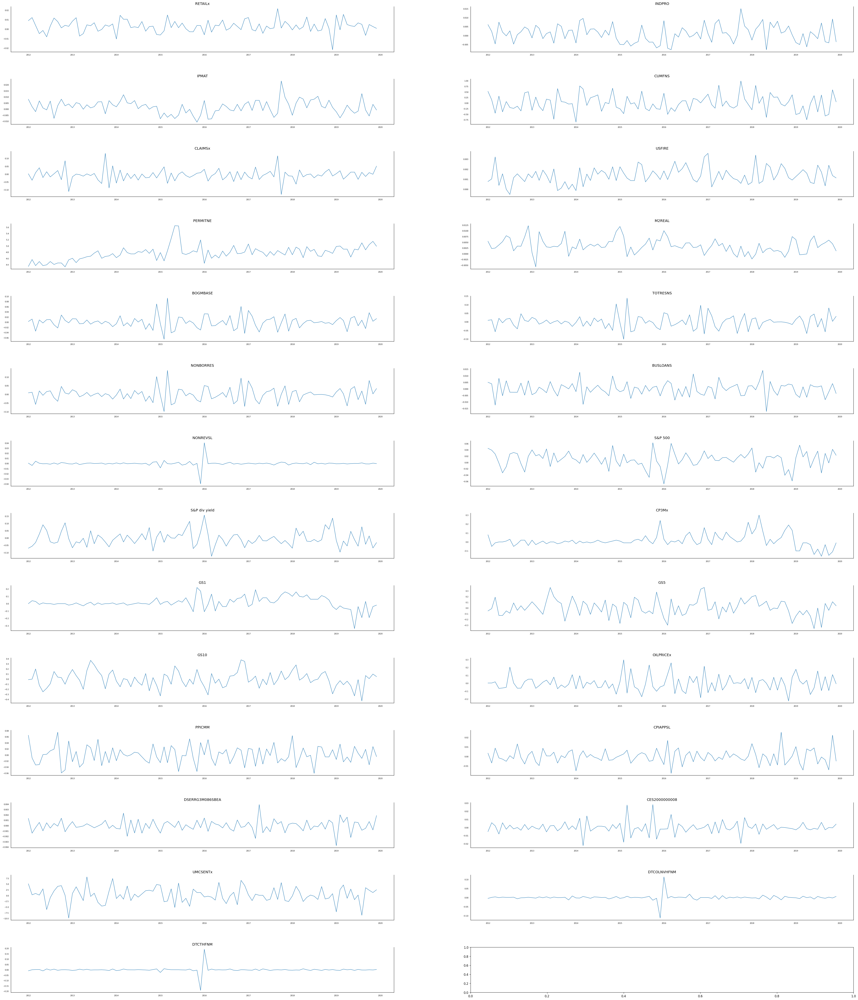

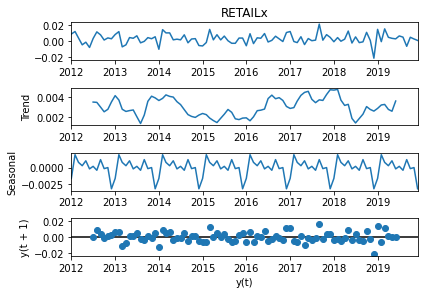

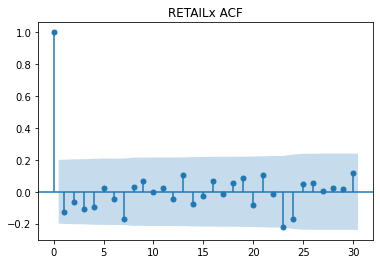

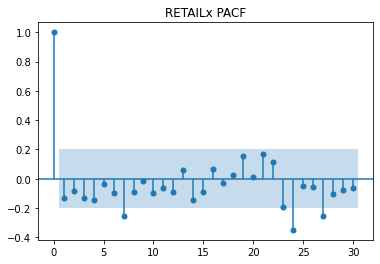

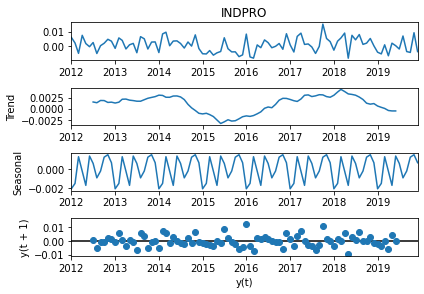

...

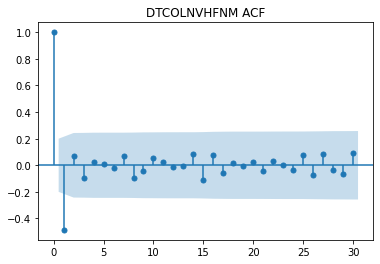

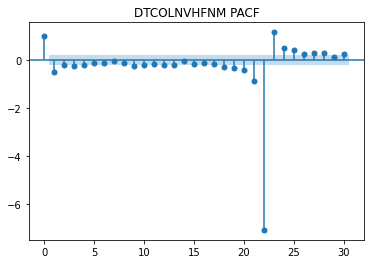

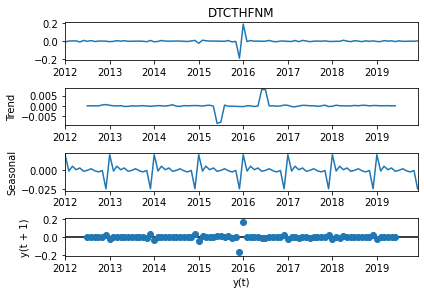

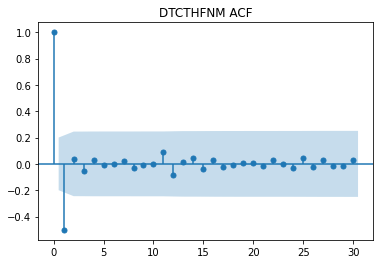

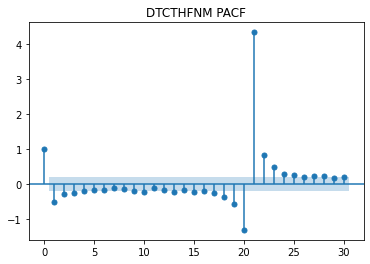

In [23]:
all_plot(df[selected_variables],season = True, acf = True,figsize = (50,60))
# どれもseasonalが発生していることがわかるので，m = 12でどこかで調整したい．

#### 変数選択
使えたのは"S_P500","GDP_growth","GCE","GDS","TRADE" 
共和分は"S_P500","GDP_growth","GCE","GDS" 



                               AR Model Results                               
Dep. Variable:                      R  -                  E                  T
Model:                          AR(2)   Log Likelihood                 299.336
Method:                          cmle   S.D. of innovations              0.006
Date:                Fri, 04 Dec 2020   AIC                            -10.041
Time:                        17:22:37   BIC                             -9.924
Sample:                    01-01-2012   HQIC                            -9.994
                         - 12-01-2018                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0034      0.001      3.752      0.000       0.002       0.005
L1.RETAILx    -0.0657      0.121     -0.543      0.587      -0.303       0.172
L2.RETAILx    -0.1581      0.121     -1.312      0.1

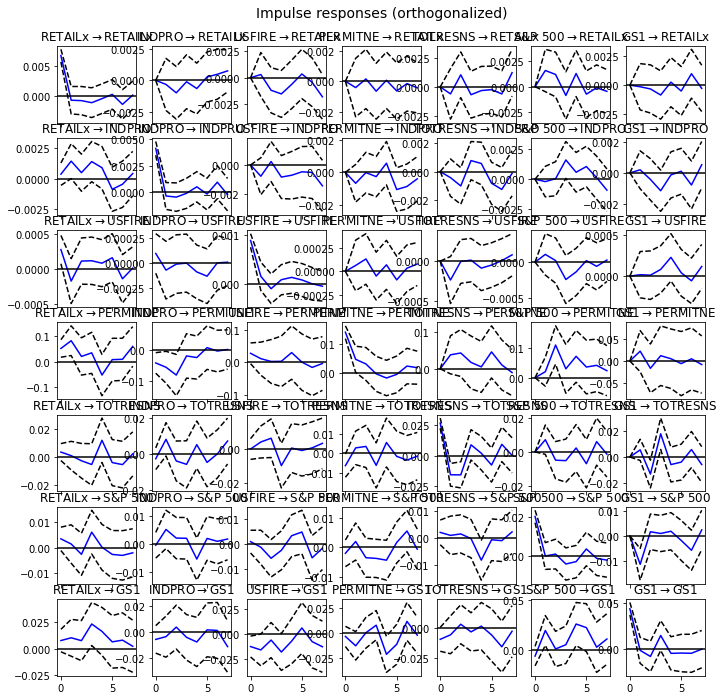

The function plots the Forecast Error Variance Decomposition
FEVD for RETAILx
       RETAILx    INDPRO    USFIRE  PERMITNE  TOTRESNS   S&P 500       GS1
0     1.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
1     0.934068  0.002126  0.001879  0.003423  0.007220  0.050870  0.000414
2     0.849673  0.019710  0.027312  0.003497  0.025846  0.071607  0.002355
3     0.787316  0.017993  0.063137  0.010016  0.030682  0.076717  0.014140
4     0.755108  0.023794  0.066639  0.009634  0.030861  0.099420  0.014544
5     0.738685  0.024301  0.067046  0.015486  0.030997  0.105276  0.018209
6     0.726963  0.026314  0.066133  0.014983  0.034562  0.099737  0.031308
7     0.671003  0.031748  0.104729  0.016249  0.051512  0.094796  0.029963
8     0.666315  0.031910  0.105392  0.016087  0.050850  0.095740  0.033705
9     0.652554  0.031221  0.120268  0.018450  0.051497  0.092843  0.033167
10    0.642379  0.032507  0.118307  0.018203  0.051391  0.101020  0.036193
11    0.636497  0.0369

{'RETAILx': 2,
 'INDPRO': 6,
 'USFIRE': 3,
 'PERMITNE': 2,
 'TOTRESNS': 5,
 'S&P 500': 3,
 'GS1': 3}

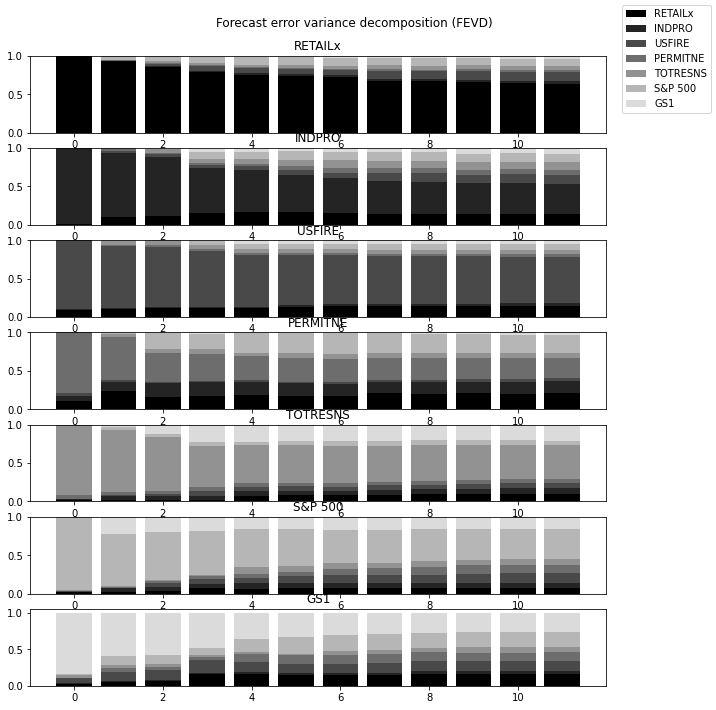

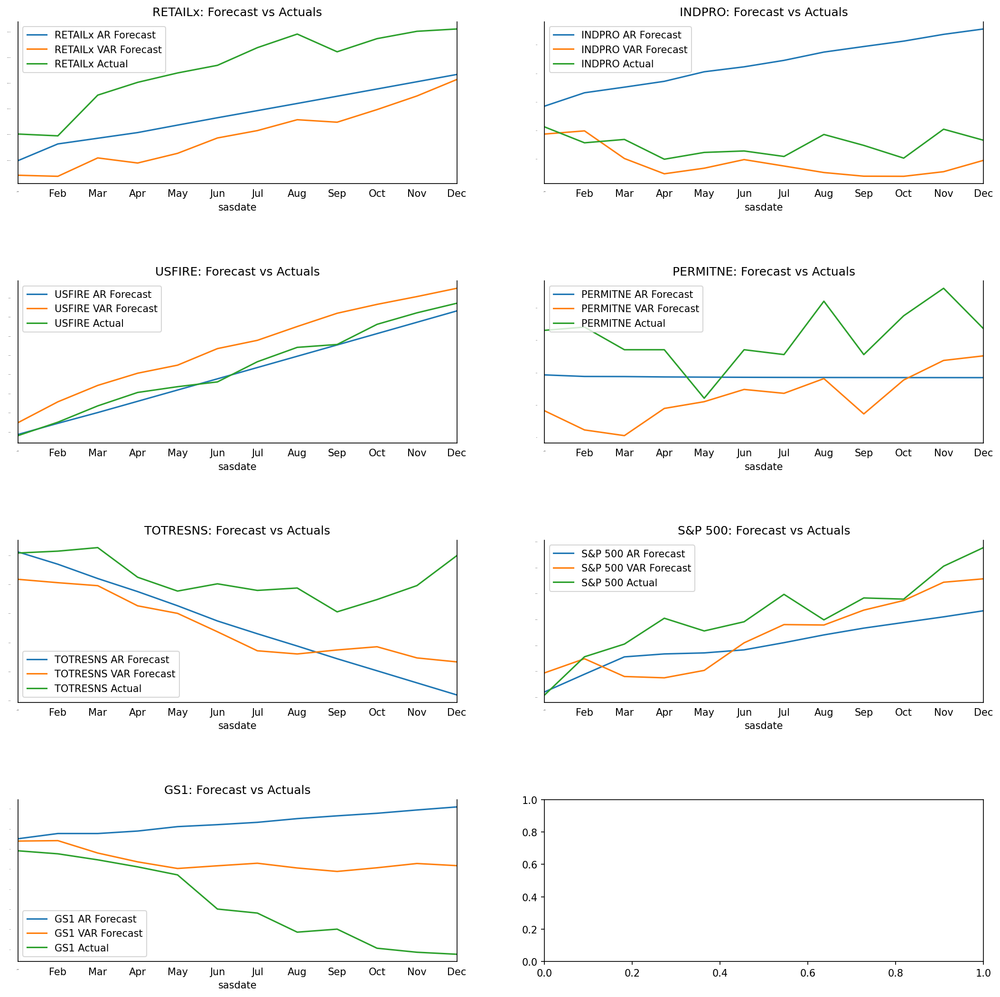

In [38]:
# Choose variables are included in the list named "ideal"
ideal = ["S&P 500","INDPRO","USFIRE","PERMITNE","RETAILx","TOTRESNS","GS1"] #"CES2000000008",
code_ideal = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in ideal}
evaluate_plot(USA[ideal],code_ideal,num=12)

GS1 shows reletively have more effects on S P 500

                               AR Model Results                               
Dep. Variable:                      C  -                  M                  R
Model:                          AR(2)   Log Likelihood                 325.123
Method:                          cmle   S.D. of innovations              0.005
Date:                Fri, 04 Dec 2020   AIC                            -10.670
Time:                        17:23:31   BIC                            -10.553
Sample:                    01-01-2012   HQIC                           -10.623
                         - 12-01-2018                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0028      0.001      4.599      0.000       0.002       0.004
L1.CMRMTSPLx    -0.1663      0.108     -1.533      0.125      -0.379       0.046
L2.CMRMTSPLx    -0.2638      0.108     -2.44

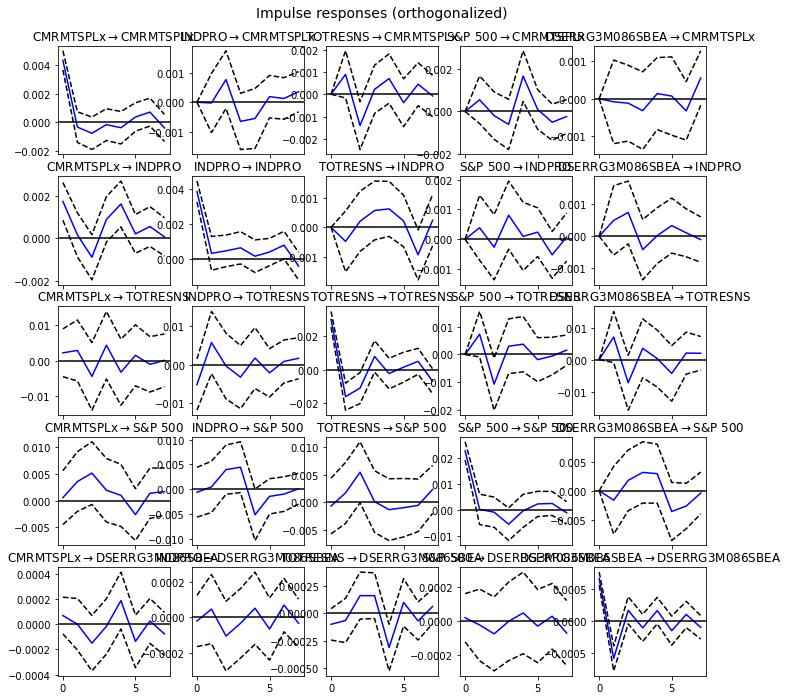

The function plots the Forecast Error Variance Decomposition
FEVD for CMRMTSPLx
      CMRMTSPLx    INDPRO  TOTRESNS   S&P 500  DSERRG3M086SBEA
0      1.000000  0.000000  0.000000  0.000000         0.000000
1      0.945373  0.000034  0.039075  0.015169         0.000349
2      0.840975  0.025408  0.117985  0.014717         0.000916
3      0.808498  0.041825  0.115240  0.029358         0.005080
4      0.705858  0.047099  0.117348  0.124618         0.005078
5      0.702484  0.047801  0.121046  0.123472         0.005197
6      0.693983  0.046570  0.123327  0.127526         0.008594
7      0.684081  0.049802  0.120877  0.126643         0.018597
8      0.675375  0.051945  0.127678  0.126556         0.018446
9      0.667740  0.056079  0.128178  0.126611         0.021393
10     0.662025  0.055543  0.127934  0.132420         0.022078
11     0.660780  0.055807  0.127425  0.134066         0.021921

FEVD for INDPRO
      CMRMTSPLx    INDPRO  TOTRESNS   S&P 500  DSERRG3M086SBEA
0      0.167312  0.83

{'CMRMTSPLx': 2,
 'INDPRO': 6,
 'TOTRESNS': 5,
 'S&P 500': 3,
 'DSERRG3M086SBEA': 3}

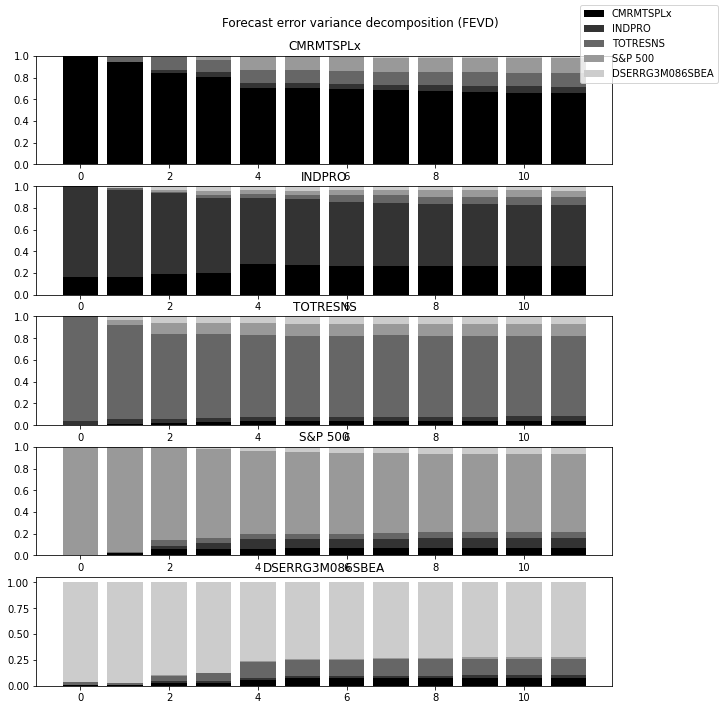

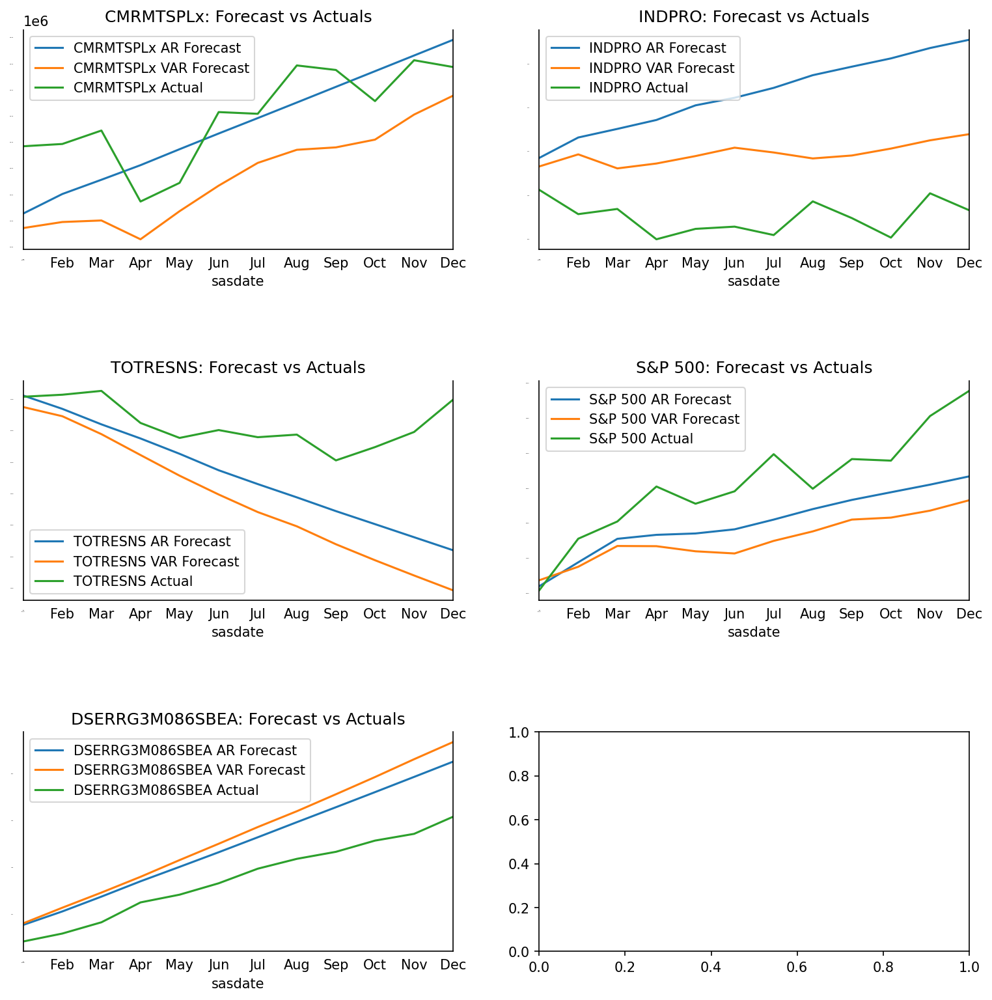

In [39]:
# ideal = ["GS1","UMCSENTx"]
# code_ideal = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in ideal}
# a,c = ARmodel(df)
# b = revert_forecast(USA,a,transformation_code)

alternative = ["S&P 500","INDPRO","DSERRG3M086SBEA","TOTRESNS","CMRMTSPLx"] #"CES2000000008",
code_alternative = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in alternative}
evaluate_plot(USA[alternative],code_alternative,num=12)


                               AR Model Results                               
Dep. Variable:                      I  -                  P                  M
Model:                          AR(1)   Log Likelihood                 316.640
Method:                          cmle   S.D. of innovations              0.005
Date:                Fri, 04 Dec 2020   AIC                            -10.395
Time:                        17:24:01   BIC                            -10.308
Sample:                    01-01-2012   HQIC                           -10.360
                         - 12-01-2018                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0014      0.001      2.165      0.030       0.000       0.003
L1.IPMAT       0.2677      0.106      2.521      0.012       0.060       0.476
                                    Roots           

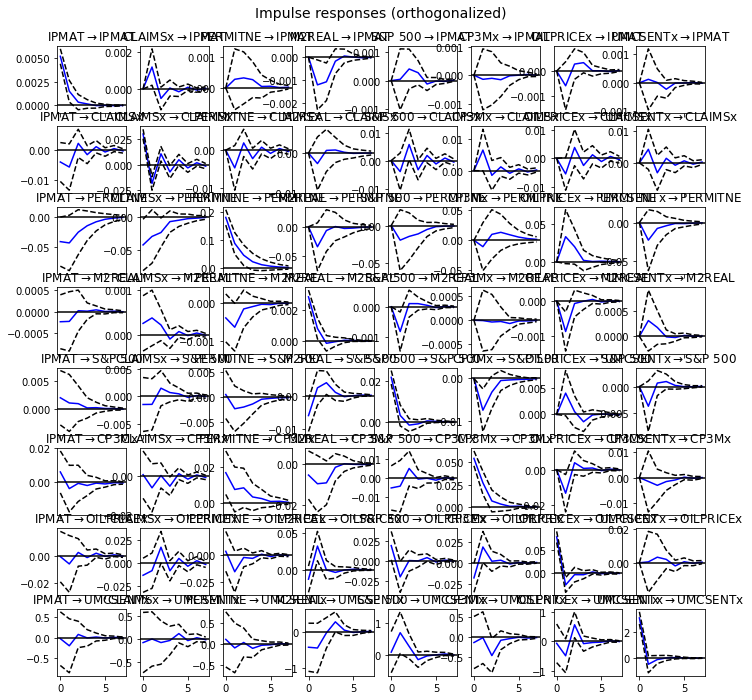

The function plots the Forecast Error Variance Decomposition
FEVD for IPMAT
         IPMAT   CLAIMSx  PERMITNE    M2REAL   S&P 500     CP3Mx  OILPRICEx  UMCSENTx
0     1.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000
1     0.896392  0.043568  0.002360  0.046051  0.000070  0.000631   0.010443  0.000485
2     0.849443  0.048949  0.005243  0.077828  0.005069  0.000935   0.012070  0.000463
3     0.840531  0.048462  0.007212  0.077839  0.007299  0.001639   0.015107  0.001912
4     0.839479  0.049080  0.007269  0.077824  0.007697  0.001648   0.015092  0.001912
5     0.839204  0.049290  0.007356  0.077800  0.007700  0.001647   0.015091  0.001911
6     0.839044  0.049396  0.007359  0.077799  0.007718  0.001669   0.015099  0.001915
7     0.838988  0.049415  0.007375  0.077797  0.007728  0.001669   0.015109  0.001920
8     0.838964  0.049436  0.007375  0.077794  0.007732  0.001671   0.015109  0.001920
9     0.838956  0.049441  0.007376  0.077794  0.007732  0.001671

{'IPMAT': 1,
 'CLAIMSx': 2,
 'PERMITNE': 2,
 'M2REAL': 1,
 'S&P 500': 3,
 'CP3Mx': 3,
 'OILPRICEx': 4,
 'UMCSENTx': 5}

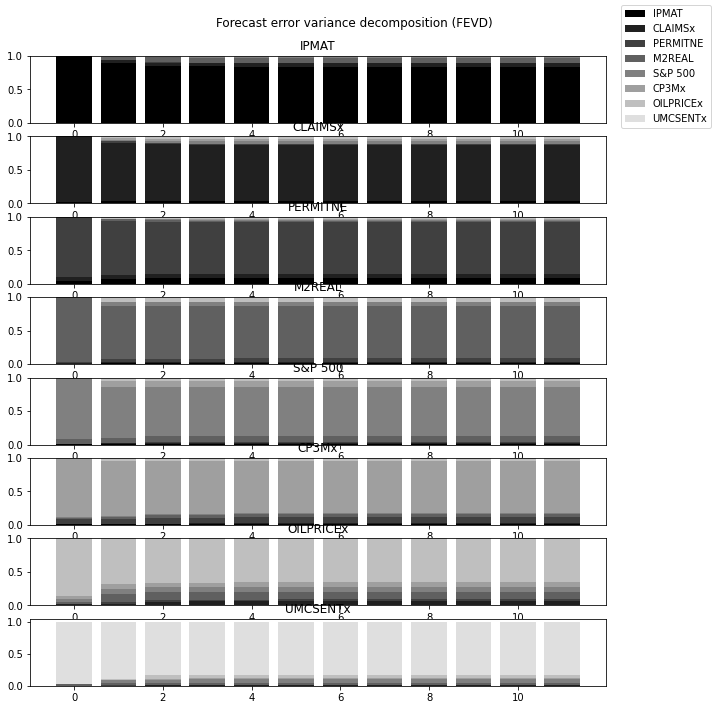

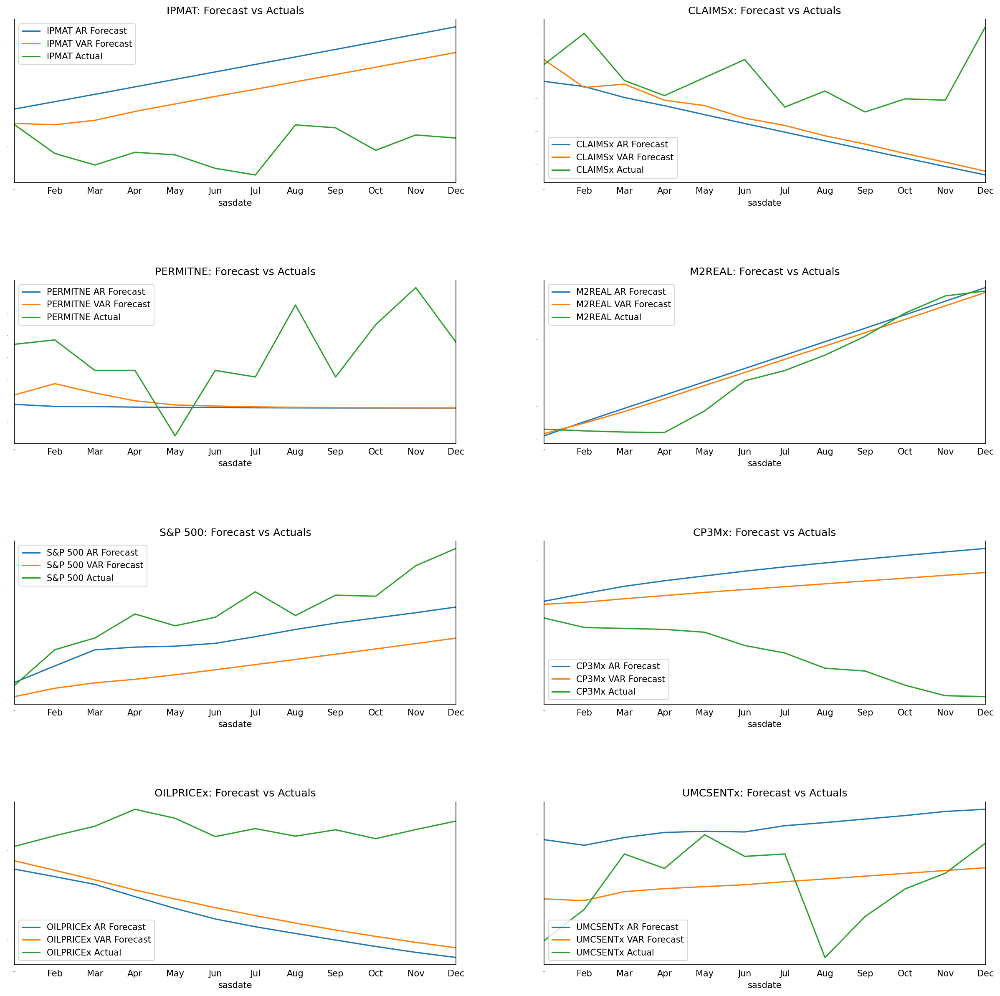

In [40]:
first_round = ["S&P 500","IPMAT","CLAIMSx","PERMITNE","UMCSENTx","M2REAL","CP3Mx","OILPRICEx"] #"CES2000000008",
code_first_round = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in first_round}
evaluate_plot(USA[first_round],code_first_round,num=12)
#他になければCP3Mxを加えてもいい．

                               AR Model Results                               
Dep. Variable:                      C  -                  U                  M
Model:                          AR(1)   Log Likelihood                 -31.134
Method:                          cmle   S.D. of innovations              0.352
Date:                Fri, 04 Dec 2020   AIC                             -2.015
Time:                        17:25:22   BIC                             -1.928
Sample:                    01-01-2012   HQIC                            -1.980
                         - 12-01-2018                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0333      0.039      0.849      0.396      -0.044       0.110
L1.CUMFNS     -0.2069      0.108     -1.915      0.055      -0.419       0.005
                                    Roots           

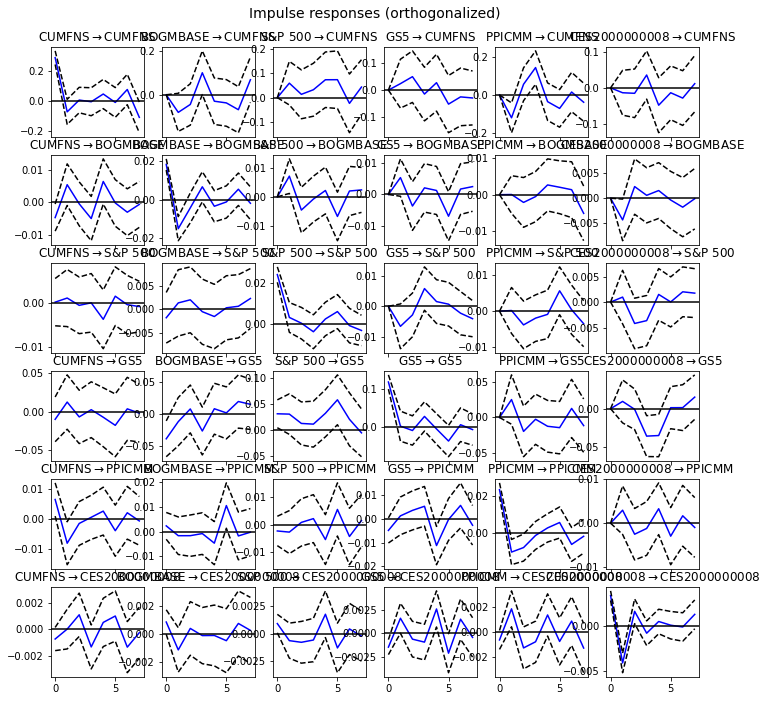

The function plots the Forecast Error Variance Decomposition
FEVD for CUMFNS
        CUMFNS  BOGMBASE   S&P 500       GS5    PPICMM  CES2000000008
0     1.000000  0.000000  0.000000  0.000000  0.000000       0.000000
1     0.776017  0.057678  0.031533  0.005105  0.128035       0.001632
2     0.724560  0.070121  0.030976  0.025335  0.145593       0.003415
3     0.567300  0.121070  0.031123  0.021213  0.248357       0.010938
4     0.536701  0.117022  0.061241  0.024133  0.236883       0.024019
5     0.493476  0.115101  0.086264  0.036942  0.245142       0.023075
6     0.490952  0.131663  0.083494  0.037770  0.230402       0.025718
7     0.498139  0.140956  0.084209  0.038020  0.214824       0.023852
8     0.489950  0.141214  0.092822  0.037570  0.211840       0.026604
9     0.480628  0.139965  0.092278  0.040386  0.212165       0.034578
10    0.476301  0.139031  0.096587  0.040940  0.212514       0.034627
11    0.476492  0.136598  0.099066  0.043487  0.210348       0.034010

FEVD for BOG

{'CUMFNS': 1,
 'BOGMBASE': 5,
 'S&P 500': 3,
 'GS5': 1,
 'PPICMM': 4,
 'CES2000000008': 6}

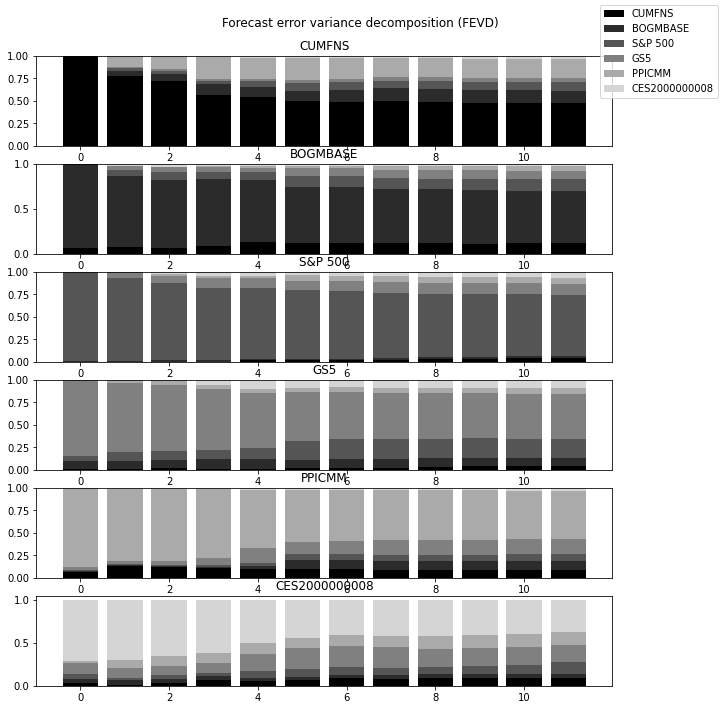

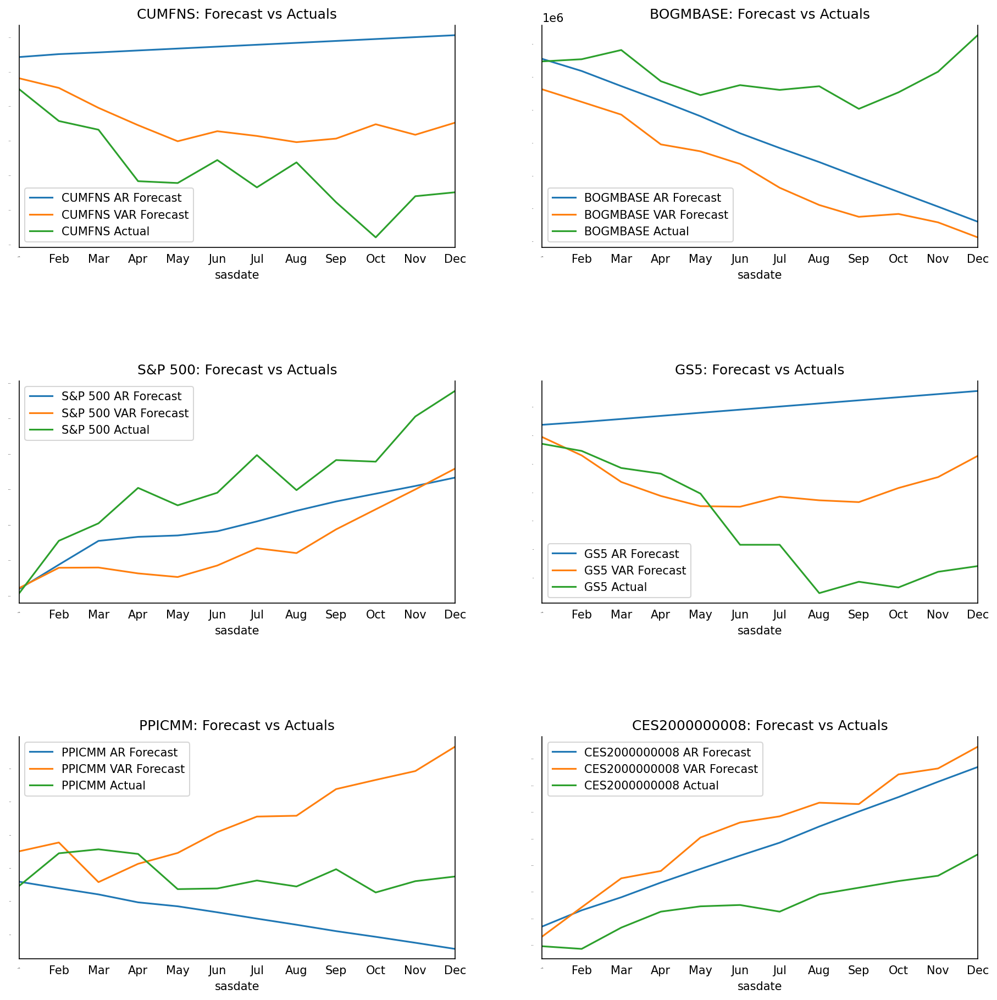

In [41]:
second_round = ["S&P 500","CUMFNS","CES2000000008","BOGMBASE","GS5","PPICMM"] #"CES2000000008",
code_second_round = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in second_round}
evaluate_plot(USA[second_round],code_second_round,num=12)
#GS5は有効っぽい．

                               AR Model Results                               
Dep. Variable:                      N  -                  O                  N
Model:                          AR(5)   Log Likelihood                 167.854
Method:                          cmle   S.D. of innovations              0.029
Date:                Fri, 04 Dec 2020   AIC                             -6.910
Time:                        17:26:13   BIC                             -6.700
Sample:                    01-01-2012   HQIC                            -6.826
                         - 12-01-2018                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0009      0.003     -0.262      0.793      -0.008       0.006
L1.NONBORRES    -0.6978      0.113     -6.181      0.000      -0.919      -0.477
L2.NONBORRES    -0.7359      0.129     -5.69

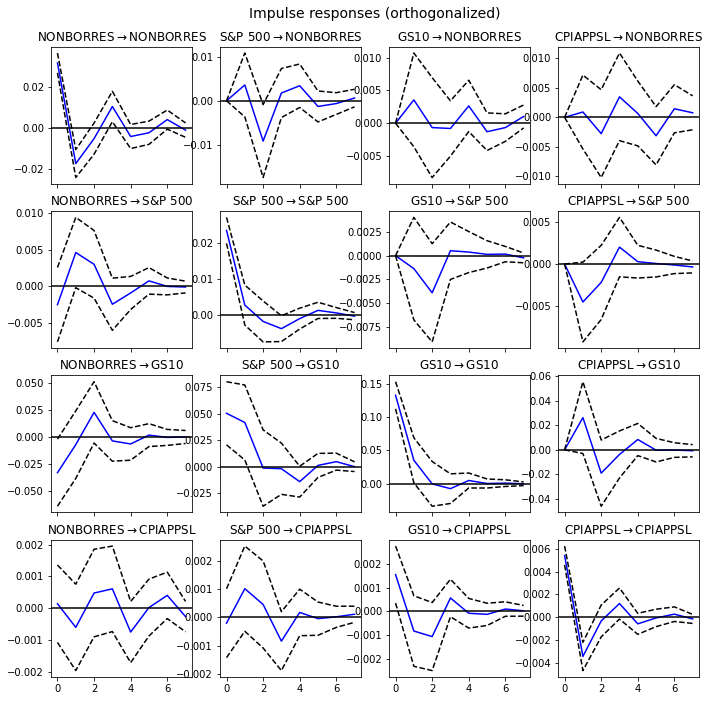

The function plots the Forecast Error Variance Decomposition
FEVD for NONBORRES
      NONBORRES   S&P 500      GS10  CPIAPPSL
0      1.000000  0.000000  0.000000  0.000000
1      0.979985  0.009868  0.009530  0.000617
2      0.917438  0.067667  0.009045  0.005851
3      0.913786  0.064369  0.008753  0.013093
4      0.903833  0.070226  0.012882  0.013060
5      0.896866  0.070440  0.013772  0.018922
6      0.896246  0.069874  0.013889  0.019990
7      0.895226  0.069970  0.014495  0.020309
8      0.894465  0.069840  0.014522  0.021173
9      0.894445  0.069751  0.014546  0.021259
10     0.894241  0.069800  0.014624  0.021335
11     0.894134  0.069770  0.014622  0.021475

FEVD for S&P 500
      NONBORRES   S&P 500      GS10  CPIAPPSL
0      0.011245  0.988755  0.000000  0.000000
1      0.045669  0.917796  0.003092  0.033442
2      0.057629  0.876131  0.027048  0.039192
3      0.064527  0.865113  0.026488  0.043873
4      0.065556  0.863945  0.026630  0.043870
5      0.066175  0.863553  0

{'NONBORRES': 5, 'S&P 500': 3, 'GS10': 1, 'CPIAPPSL': 6}

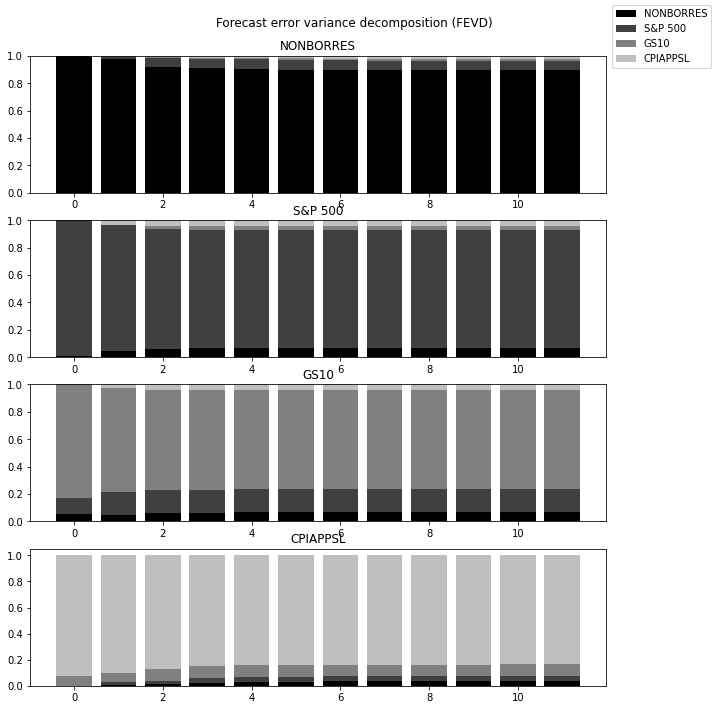

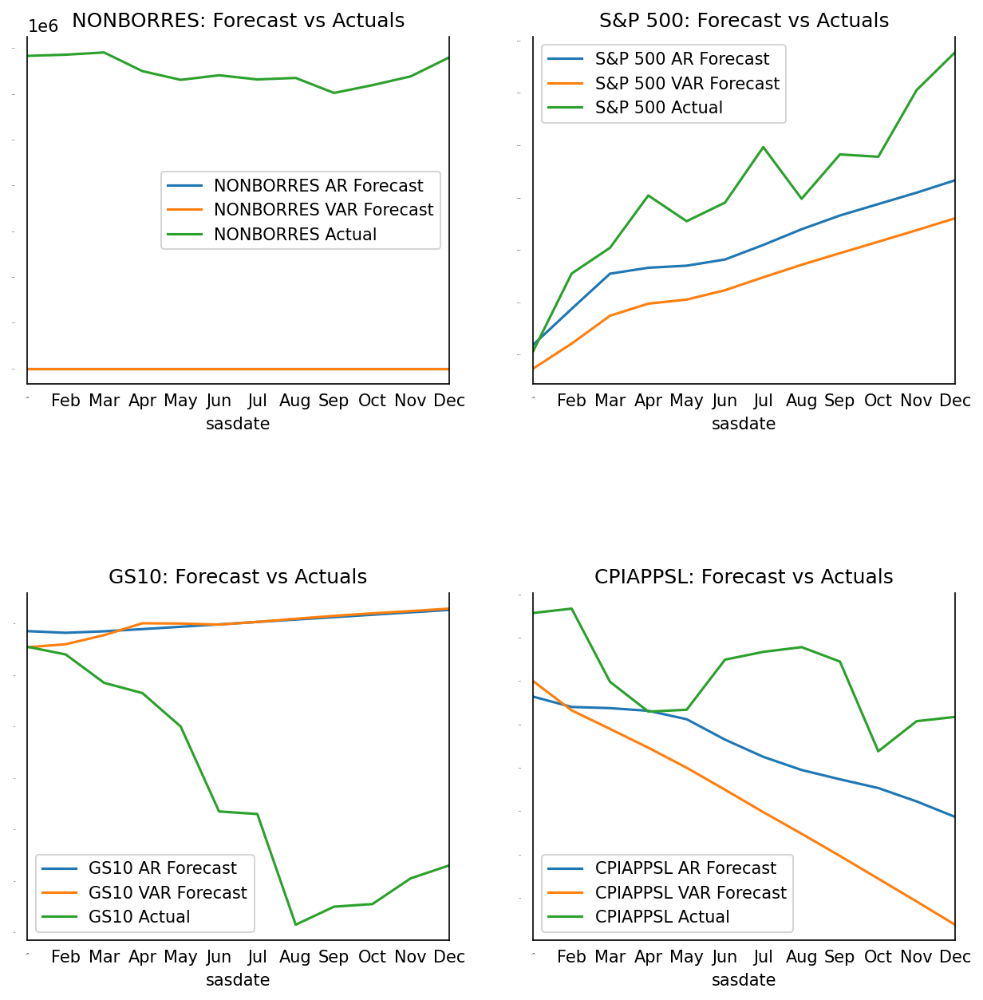

In [42]:
third_round = ["S&P 500","NONBORRES","GS10","CPIAPPSL"] #"CES2000000008",
code_third_round = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in third_round}
evaluate_plot(USA[third_round],code_third_round,num=12)
#NONBORRESで諦めるか？

                               AR Model Results                               
Dep. Variable:                      S  -                  &                  P
Model:                          AR(3)   Log Likelihood                 189.546
Method:                          cmle   S.D. of innovations              0.023
Date:                Fri, 04 Dec 2020   AIC                             -7.395
Time:                        17:26:54   BIC                             -7.247
Sample:                    01-01-2012   HQIC                            -7.335
                         - 12-01-2018                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0109      0.003      3.284      0.001       0.004       0.017
L1.S&P 500     0.0688      0.117      0.587      0.557      -0.161       0.298
L2.S&P 500    -0.1340      0.115     -1.166      0.2

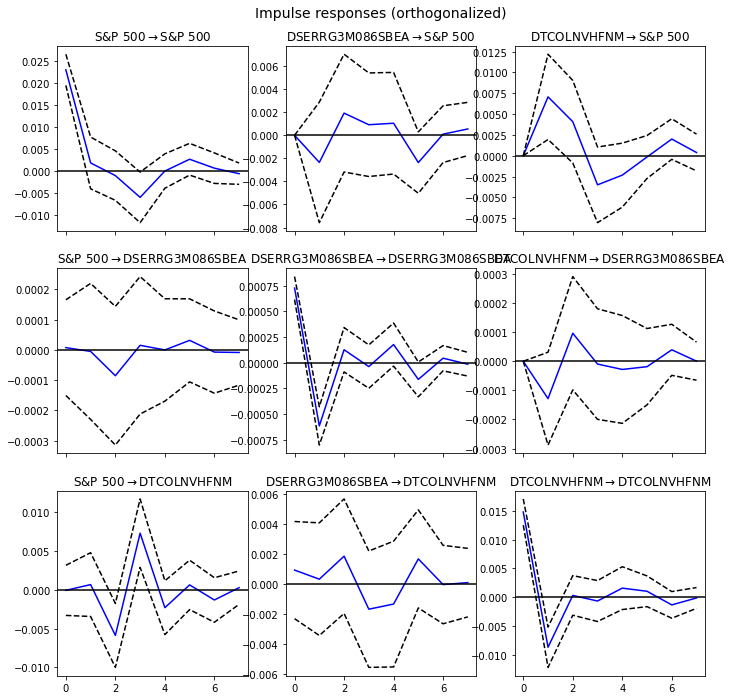

The function plots the Forecast Error Variance Decomposition
FEVD for S&P 500
       S&P 500  DSERRG3M086SBEA  DTCOLNVHFNM
0     1.000000         0.000000     0.000000
1     0.905104         0.009461     0.085434
2     0.874821         0.015230     0.109949
3     0.864130         0.015381     0.120488
4     0.855585         0.016886     0.127529
5     0.849990         0.024864     0.125146
6     0.845064         0.024715     0.130220
7     0.844590         0.025130     0.130280
8     0.843459         0.025789     0.130752
9     0.842745         0.026240     0.131015
10    0.842635         0.026308     0.131056
11    0.842491         0.026309     0.131200

FEVD for DSERRG3M086SBEA
       S&P 500  DSERRG3M086SBEA  DTCOLNVHFNM
0     0.000103         0.999897     0.000000
1     0.000088         0.981999     0.017913
2     0.007738         0.965207     0.027056
3     0.007960         0.964937     0.027103
4     0.007703         0.965270     0.027028
5     0.008465         0.964903     0.026

{'S&P 500': 3, 'DSERRG3M086SBEA': 3, 'DTCOLNVHFNM': 3}

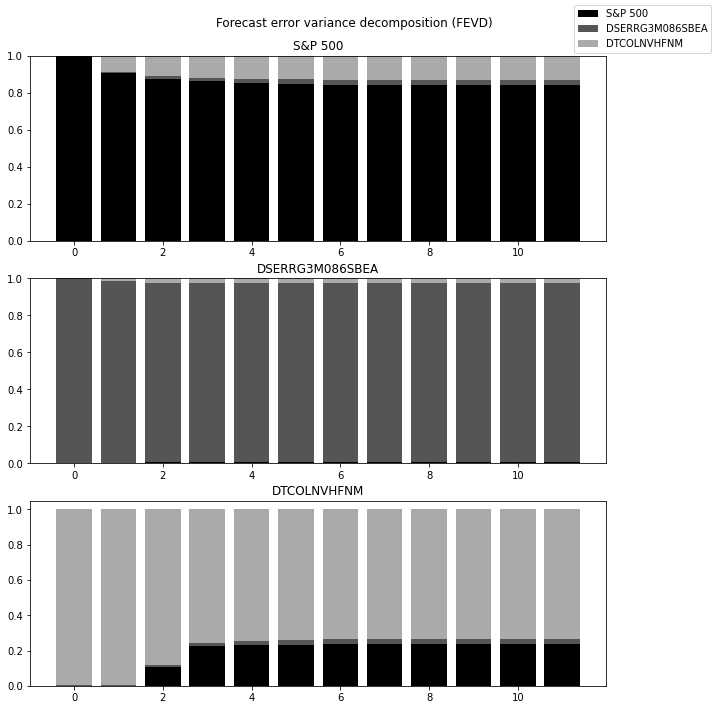

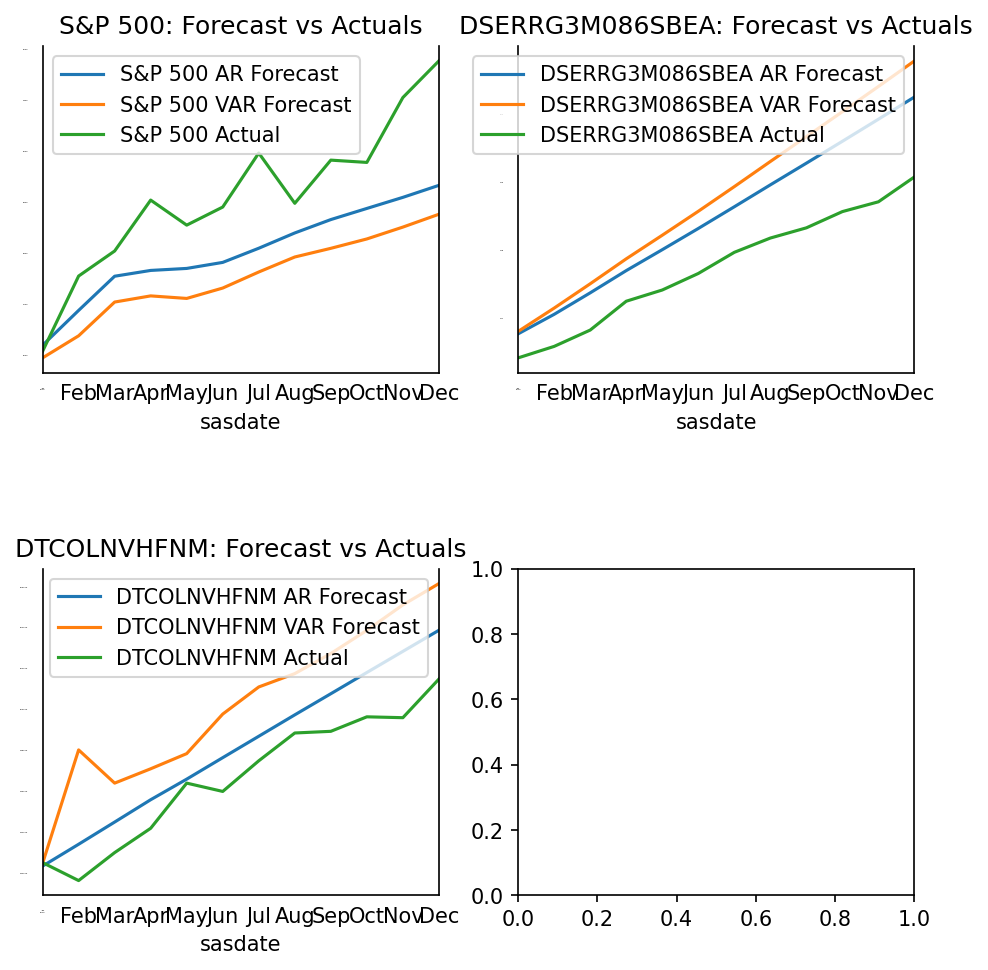

In [43]:
fourth_round = ["S&P 500","DTCOLNVHFNM","DSERRG3M086SBEA"] #"CES2000000008",
code_fourth_round = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in fourth_round}
evaluate_plot(USA[fourth_round],code_fourth_round,num=12)
# DTCOLNVHFNMはあり

                               AR Model Results                               
Dep. Variable:                      S  -                  &                  P
Model:                          AR(3)   Log Likelihood                 189.546
Method:                          cmle   S.D. of innovations              0.023
Date:                Fri, 04 Dec 2020   AIC                             -7.395
Time:                        17:28:01   BIC                             -7.247
Sample:                    01-01-2012   HQIC                            -7.335
                         - 12-01-2018                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0109      0.003      3.284      0.001       0.004       0.017
L1.S&P 500     0.0688      0.117      0.587      0.557      -0.161       0.298
L2.S&P 500    -0.1340      0.115     -1.166      0.2

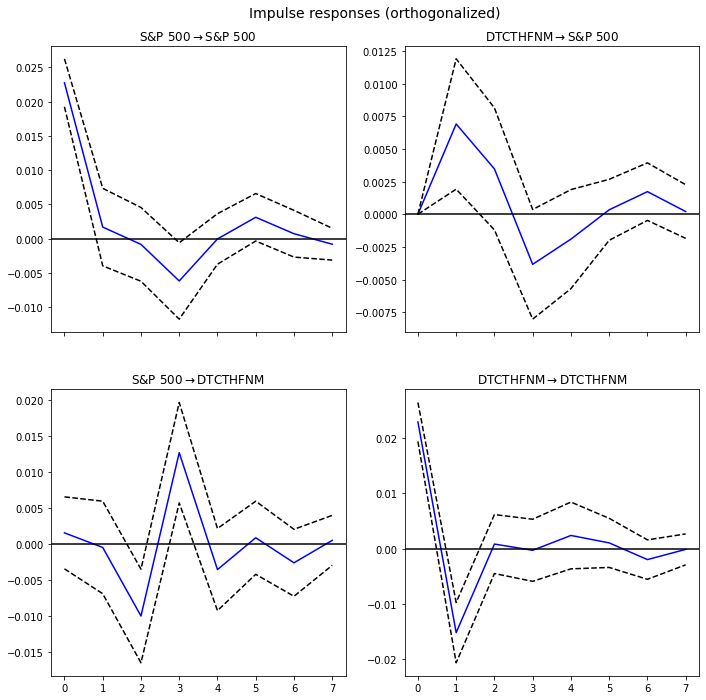

The function plots the Forecast Error Variance Decomposition
FEVD for S&P 500
       S&P 500  DTCTHFNM
0     1.000000  0.000000
1     0.915935  0.084065
2     0.897024  0.102976
3     0.882383  0.117617
4     0.877349  0.122651
5     0.879039  0.120961
6     0.875094  0.124906
7     0.875164  0.124836
8     0.874618  0.125382
9     0.874434  0.125566
10    0.874430  0.125570
11    0.874283  0.125717

FEVD for DTCTHFNM
       S&P 500  DTCTHFNM
0     0.004596  0.995404
1     0.003489  0.996511
2     0.119161  0.880839
3     0.258241  0.741759
4     0.265780  0.734220
5     0.266040  0.733960
6     0.269779  0.730221
7     0.269959  0.730041
8     0.270983  0.729017
9     0.270886  0.729114
10    0.270918  0.729082
11    0.271020  0.728980


S&P 500 AR Accuracy
S&P 500
mape : 0.0378
mean : -110.6512
mae : 112.6119
mpe : -0.037
rmse : 130.0527
corr : 0.9506
minmax : 0.0378
----------------------------
S&P 500 VAR Accuracy
S&P 500
mape : 0.055
mean : -163.3536
mae : 163.3536
mpe : -0.055
rm

{'S&P 500': 3, 'DTCTHFNM': 3}

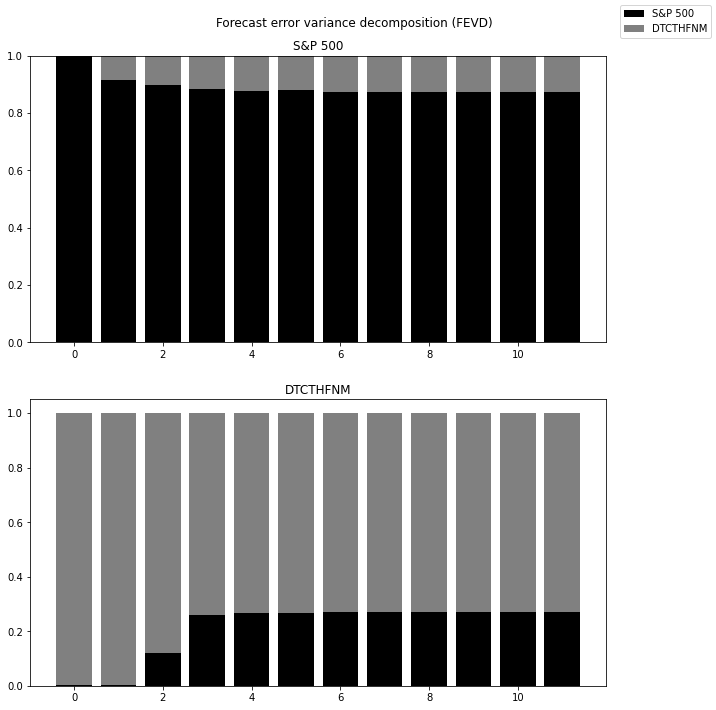

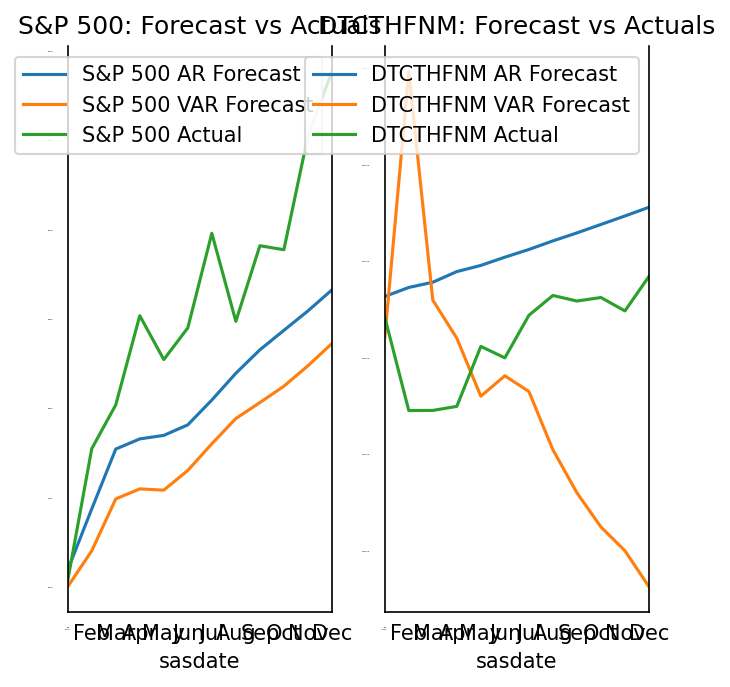

In [44]:
fifth_round = ["S&P 500","DTCTHFNM"] #"CES2000000008",
code_fifth_round = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in fifth_round}
evaluate_plot(USA[fifth_round],code_fifth_round,num=12)

                               AR Model Results                               
Dep. Variable:                      C  -                  M                  R
Model:                          AR(2)   Log Likelihood                 325.123
Method:                          cmle   S.D. of innovations              0.005
Date:                Fri, 04 Dec 2020   AIC                            -10.670
Time:                        18:24:30   BIC                            -10.553
Sample:                    01-01-2012   HQIC                           -10.623
                         - 12-01-2018                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0028      0.001      4.599      0.000       0.002       0.004
L1.CMRMTSPLx    -0.1663      0.108     -1.533      0.125      -0.379       0.046
L2.CMRMTSPLx    -0.2638      0.108     -2.44

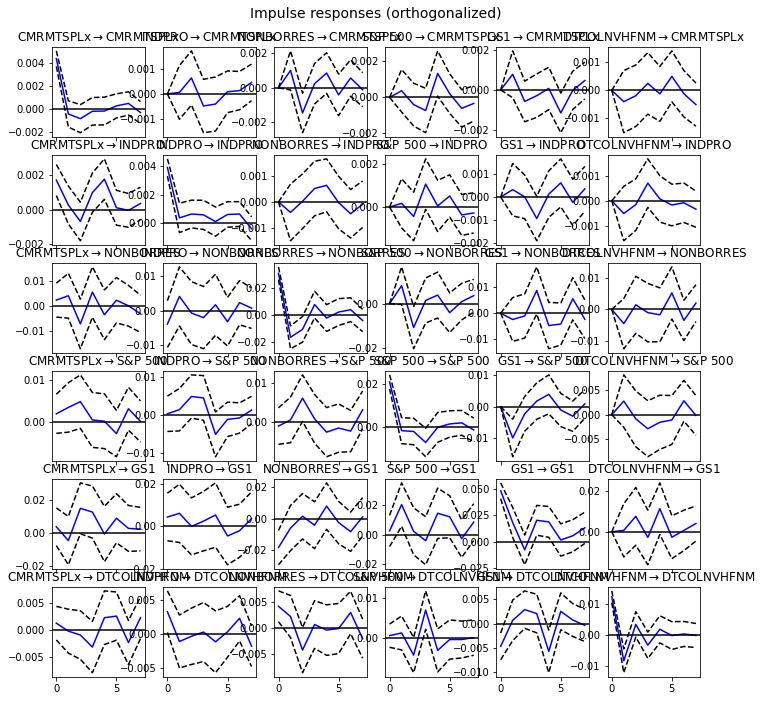

The function plots the Forecast Error Variance Decomposition
FEVD for CMRMTSPLx
      CMRMTSPLx    INDPRO  NONBORRES   S&P 500       GS1  DTCOLNVHFNM
0      1.000000  0.000000   0.000000  0.000000  0.000000     0.000000
1      0.908835  0.000173   0.048083  0.006477  0.028938     0.007495
2      0.801083  0.016728   0.124602  0.011788  0.038044     0.007755
3      0.771606  0.025257   0.121954  0.031494  0.039797     0.009892
4      0.699900  0.028673   0.135973  0.089764  0.036222     0.009468
5      0.659291  0.027166   0.132986  0.085741  0.077733     0.017084
6      0.646469  0.026925   0.139389  0.094773  0.075434     0.017010
7      0.631544  0.032782   0.135757  0.095466  0.080147     0.024303
8      0.623683  0.034546   0.143849  0.094850  0.079216     0.023856
9      0.619194  0.038695   0.144831  0.094429  0.079033     0.023818
10     0.614763  0.038753   0.143599  0.098026  0.079552     0.025306
11     0.613280  0.039085   0.143560  0.098076  0.080308     0.025692

FEVD for 

{'CMRMTSPLx': 2,
 'INDPRO': 6,
 'NONBORRES': 5,
 'S&P 500': 3,
 'GS1': 3,
 'DTCOLNVHFNM': 3}

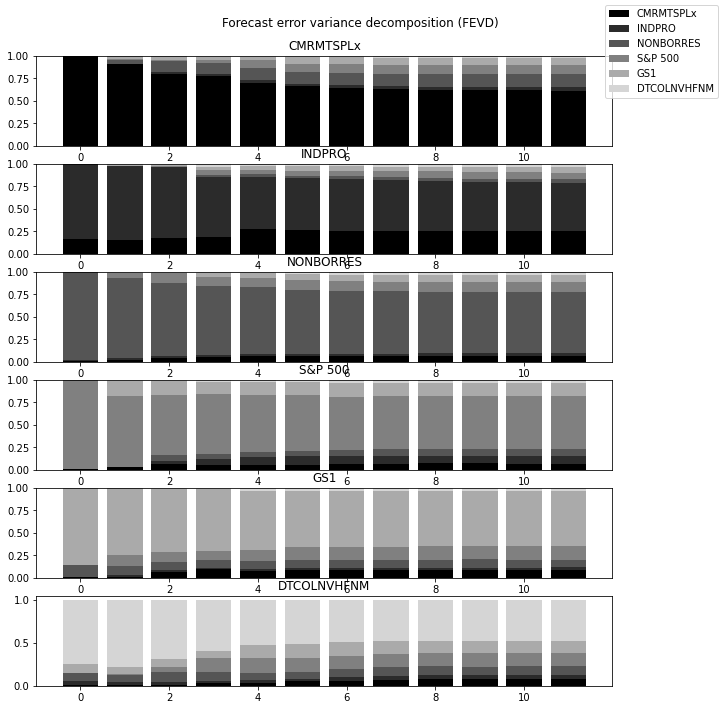

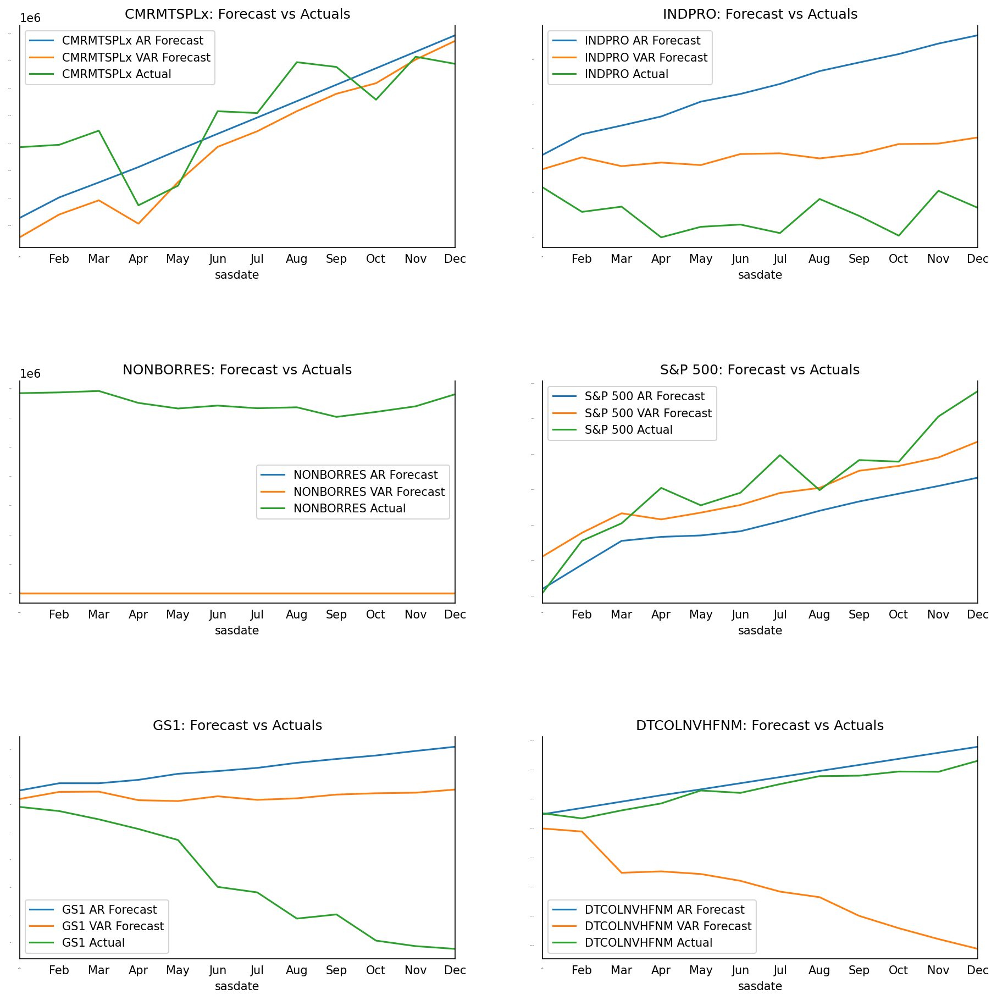

In [68]:
represent = ["S&P 500","DTCOLNVHFNM", "NONBORRES", "CMRMTSPLx", "INDPRO", "GS1"] # GS1ではrmse 75.001
code_rep = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in represent}
evaluate_plot(USA[represent],code_rep,num=12)

In [47]:
keys = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key != "S&P 500"}
for key in keys:
    cointegration_test(USA[["S&P 500",key]].dropna())

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  19.55     > 12.3212   =>   True
RPI    ::  0.22      > 4.1296    =>   False
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  18.56     > 12.3212   =>   True
W875RX1 ::  0.25      > 4.1296    =>   False
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  18.36     > 12.3212   =>   True
DPCERA3M086SBEA ::  0.02      > 4.1296    =>   False
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  18.07     > 12.3212   =>   True
CMRMTSPLx ::  0.14      > 4.1296    =>   False
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  20.2      > 12.3212   =>   True
RETAILx ::  0.17      > 4.1296    =>   False
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  

In [50]:
estimate_cointegration = ["S&P 500","IPDCONGD", "HOUSTS", "PERMITNE", "CONSPI", "GS5", "COMPAPFFx","TB3SMFFM", "TB6SMFFM", "T1YFFM", "VXOCLSx"]
keys = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in estimate_cointegration}
cointegration_test(USA[estimate_cointegration].dropna())

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
S&P 500 ::  614.35    > 263.2603  =>   True
IPDCONGD ::  427.94    > 219.4051  =>   True
HOUSTS ::  322.99    > 179.5199  =>   True
PERMITNE ::  242.59    > 143.6691  =>   True
CONSPI ::  180.73    > 111.7797  =>   True
GS5    ::  128.92    > 83.9383   =>   True
COMPAPFFx ::  87.23     > 60.0627   =>   True
TB3SMFFM ::  47.07     > 40.1749   =>   True
TB6SMFFM ::  25.37     > 24.2761   =>   True
T1YFFM ::  9.8       > 12.3212   =>   False
VXOCLSx ::  0.29      > 4.1296    =>   False


                               AR Model Results                               
Dep. Variable:                      I  -                  P                  D
Model:                          AR(3)   Log Likelihood                -172.104
Method:                          cmle   S.D. of innovations              1.638
Date:                Fri, 04 Dec 2020   AIC                              1.098
Time:                        17:48:44   BIC                              1.237
Sample:                    11-01-2011   HQIC                             1.154
                         - 07-01-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           3.5560      2.676      1.329      0.184      -1.690       8.802
L1.IPDCONGD     0.5481      0.106      5.153      0.000       0.340       0.757
L2.IPDCONGD     0.2909      0.117      2.484    

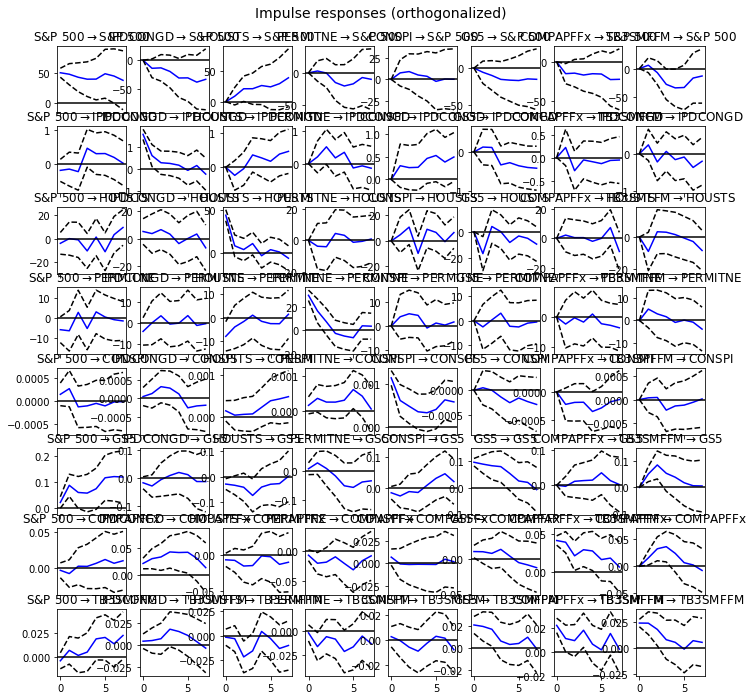

The function plots the Forecast Error Variance Decomposition
FEVD for S&P 500
      S&P 500  IPDCONGD    HOUSTS  PERMITNE    CONSPI       GS5  COMPAPFFx  TB3SMFFM
0    1.000000  0.000000  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000
1    0.884273  0.034793  0.014753  0.001544  0.010815  0.005723   0.041552  0.006547
2    0.798064  0.043132  0.062721  0.001020  0.017261  0.015319   0.051965  0.010517
3    0.669901  0.059202  0.078866  0.019615  0.013930  0.028866   0.058243  0.071377
4    0.557660  0.093761  0.094345  0.038018  0.010485  0.034813   0.053681  0.117237

FEVD for IPDCONGD
      S&P 500  IPDCONGD    HOUSTS  PERMITNE    CONSPI       GS5  COMPAPFFx  TB3SMFFM
0    0.015138  0.984862  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000
1    0.019487  0.881209  0.018239  0.014090  0.028990  0.004983   0.015369  0.017632
2    0.030480  0.756566  0.015742  0.085030  0.042309  0.007673   0.034808  0.027393
3    0.075630  0.660915  0.043873  0.080235  0.052582

{'IPDCONGD': 3,
 'HOUSTS': 3,
 'PERMITNE': 1,
 'CONSPI': 1,
 'S&P 500': 1,
 'GS5': 1,
 'COMPAPFFx': 4,
 'TB3SMFFM': 1}

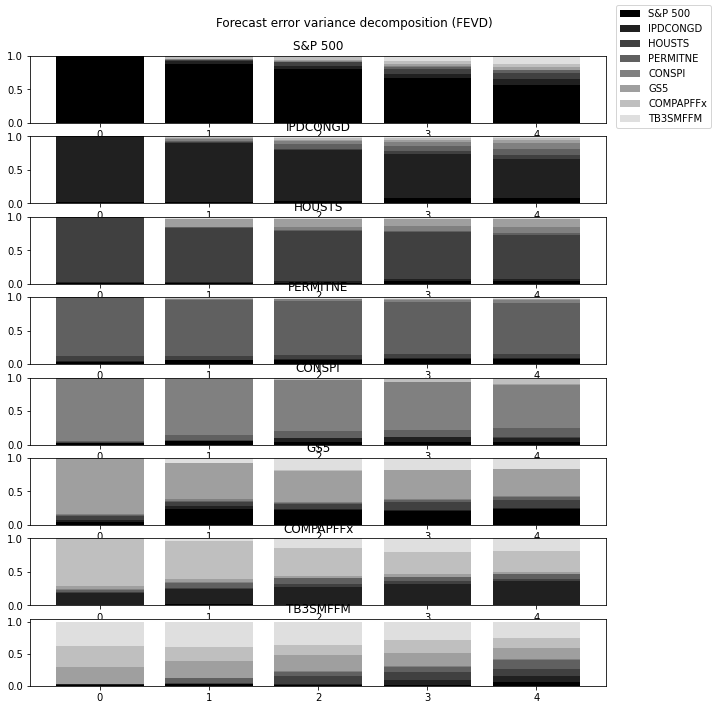

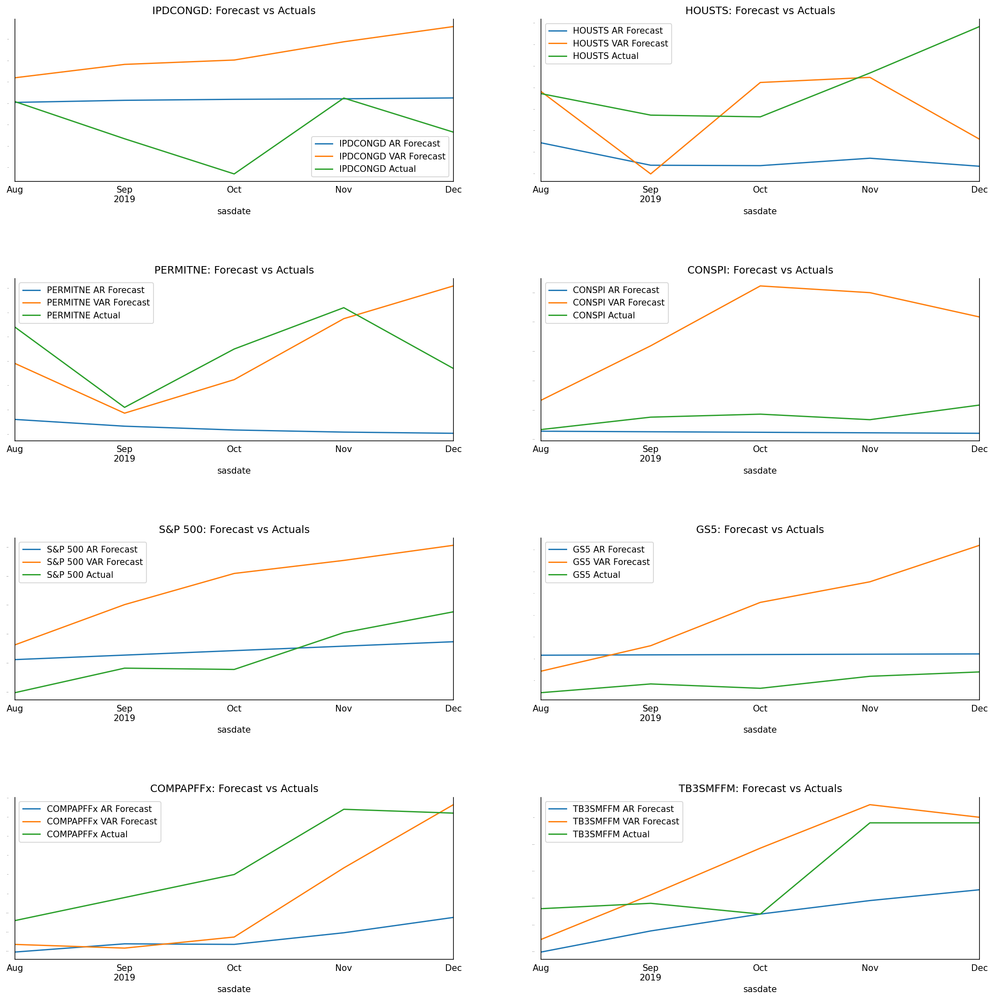

In [57]:
variables = ["S&P 500","IPDCONGD", "HOUSTS", "PERMITNE", "CONSPI", "GS5", "COMPAPFFx","TB3SMFFM"]
keys = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in variables}
coin_evaluate_plot(USA[variables],keys)

                               AR Model Results                               
Dep. Variable:                      I  -                  P                  D
Model:                          AR(8)   Log Likelihood                -157.243
Method:                          cmle   S.D. of innovations              1.539
Date:                Fri, 04 Dec 2020   AIC                              1.097
Time:                        18:18:51   BIC                              1.385
Sample:                    11-01-2011   HQIC                             1.213
                         - 07-01-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           5.9248      2.898      2.044      0.041       0.245      11.605
L1.IPDCONGD     0.5648      0.111      5.073      0.000       0.347       0.783
L2.IPDCONGD     0.1614      0.124      1.304    

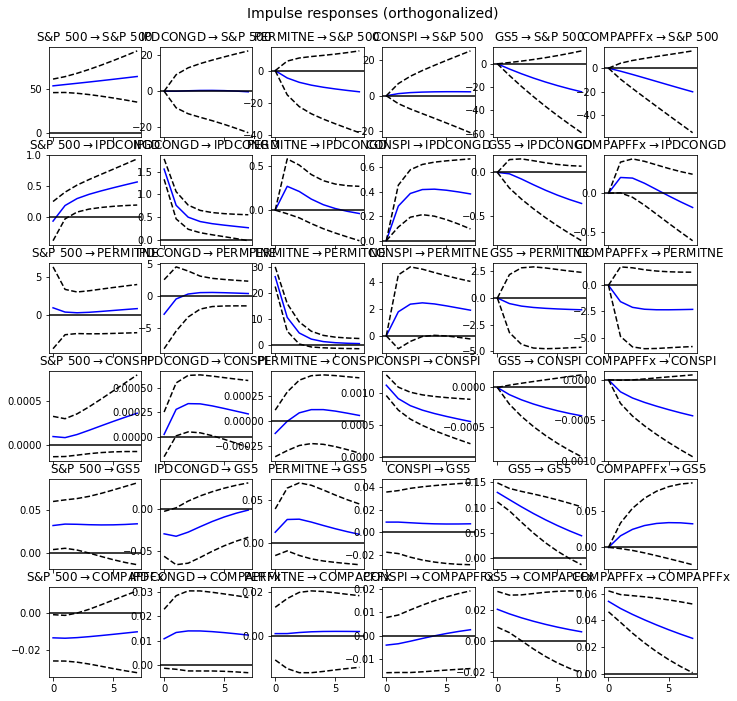

The function plots the Forecast Error Variance Decomposition
FEVD for S&P 500
      S&P 500  IPDCONGD  PERMITNE    CONSPI       GS5  COMPAPFFx
0    1.000000  0.000000  0.000000  0.000000  0.000000   0.000000
1    0.991965  0.000000  0.003441  0.000246  0.003282   0.001066
2    0.978173  0.000006  0.007763  0.000498  0.009831   0.003729
3    0.961143  0.000019  0.011729  0.000689  0.018501   0.007920
4    0.942231  0.000026  0.015111  0.000818  0.028365   0.013448

FEVD for IPDCONGD
      S&P 500  IPDCONGD  PERMITNE    CONSPI       GS5  COMPAPFFx
0    0.001985  0.998015  0.000000  0.000000  0.000000   0.000000
1    0.011949  0.928028  0.022521  0.024782  0.000082   0.012638
2    0.033279  0.853287  0.030886  0.060299  0.001593   0.020655
3    0.060198  0.787489  0.030791  0.093493  0.006119   0.021909
4    0.090172  0.727517  0.028217  0.119926  0.014200   0.019968

FEVD for PERMITNE
      S&P 500  IPDCONGD  PERMITNE    CONSPI       GS5  COMPAPFFx
0    0.001209  0.011474  0.987317  0.00

{'IPDCONGD': 8,
 'PERMITNE': 1,
 'CONSPI': 1,
 'S&P 500': 9,
 'GS5': 1,
 'COMPAPFFx': 4}

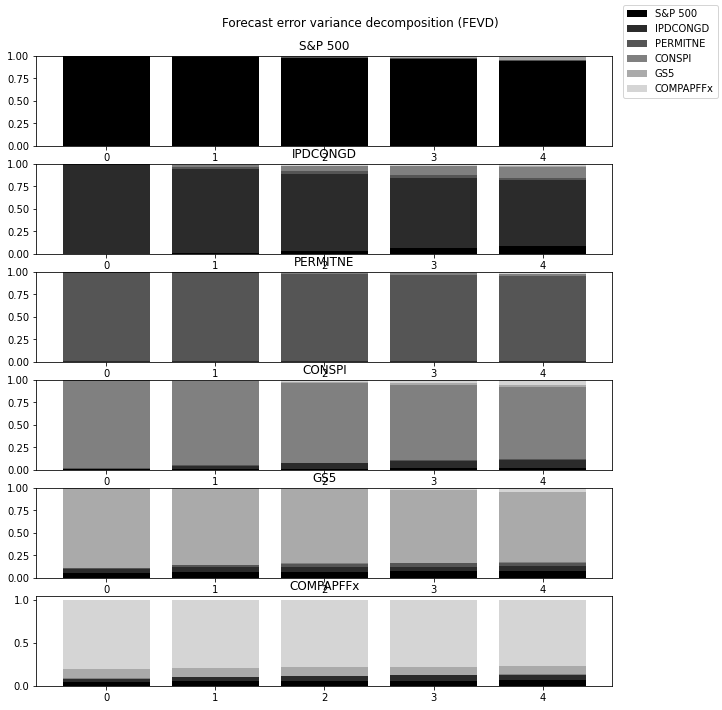

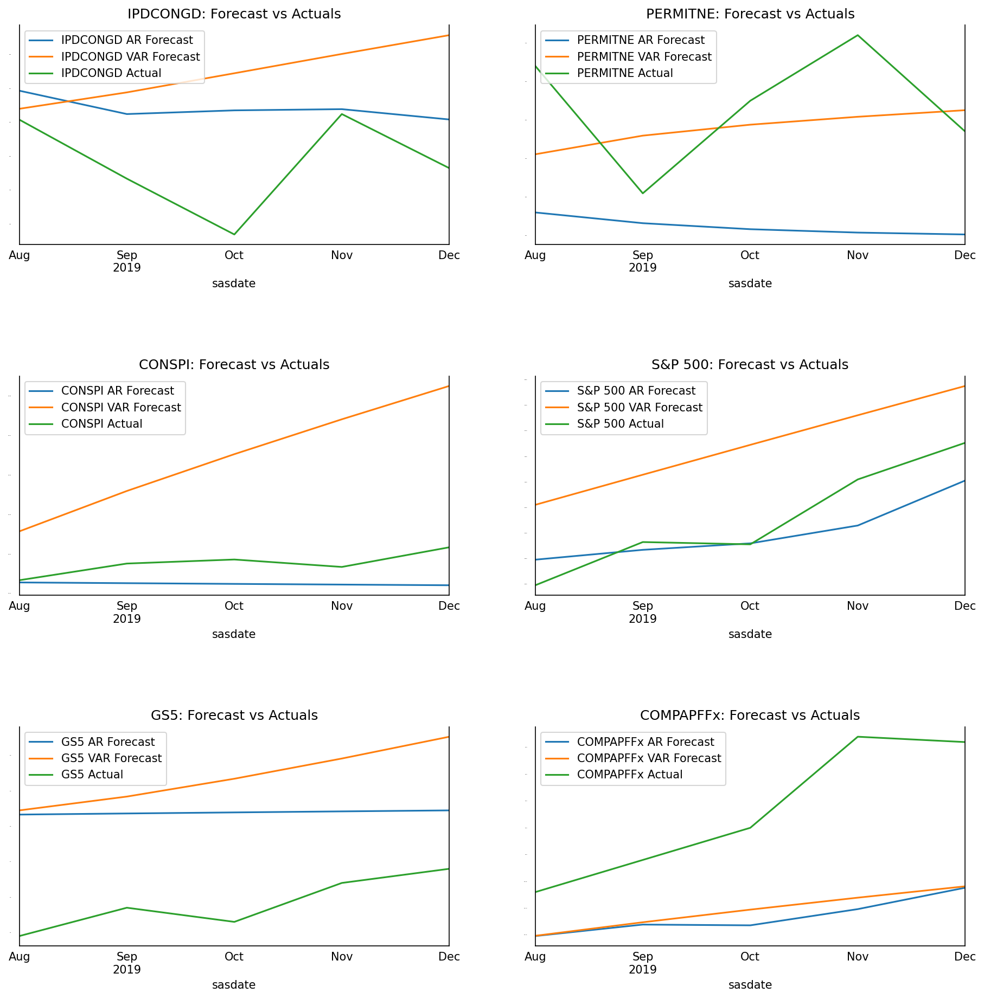

In [66]:
# omit some variables which did not show enough effects on S&P 500
variables = ["S&P 500","IPDCONGD", "PERMITNE", "CONSPI", "GS5", "COMPAPFFx"]
keys = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in variables}
coin_evaluate_plot(USA[variables],keys,order = 10)

                               AR Model Results                               
Dep. Variable:                      S  -                  &                  P
Model:                          AR(9)   Log Likelihood                -443.279
Method:                          cmle   S.D. of innovations             47.380
Date:                Fri, 04 Dec 2020   AIC                              7.978
Time:                        17:56:57   BIC                              8.297
Sample:                    11-01-2011   HQIC                             8.106
                         - 07-01-2019                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         25.9107     28.871      0.897      0.369     -30.674      82.496
L1.S&P 500     1.0865      0.111      9.786      0.000       0.869       1.304
L2.S&P 500    -0.1433      0.162     -0.886      0.3

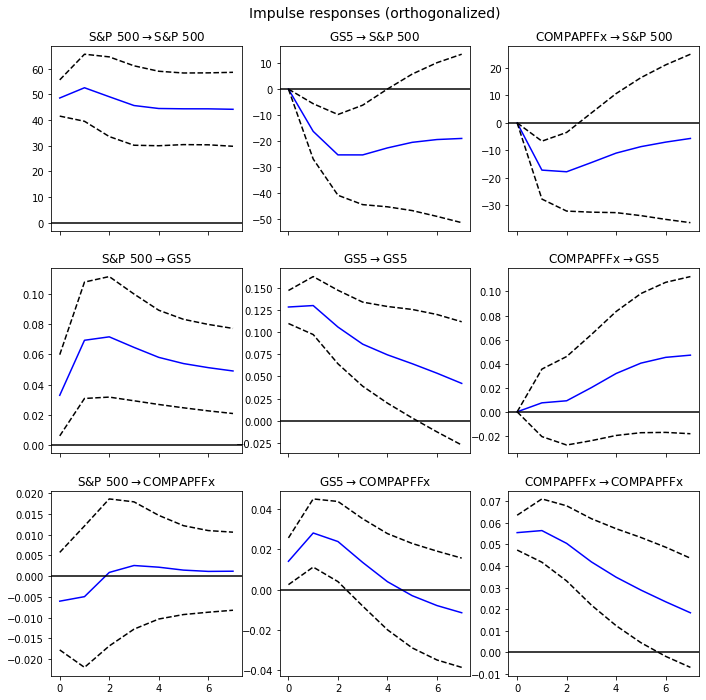

The function plots the Forecast Error Variance Decomposition
FEVD for S&P 500
      S&P 500       GS5  COMPAPFFx
0    1.000000  0.000000   0.000000
1    0.901014  0.046822   0.052163
2    0.831607  0.100573   0.067821
3    0.801619  0.129731   0.068650
4    0.793559  0.141776   0.064665

FEVD for GS5
      S&P 500       GS5  COMPAPFFx
0    0.061386  0.938614   0.000000
1    0.149121  0.849466   0.001413
2    0.196904  0.800591   0.002505
3    0.223299  0.768676   0.008025
4    0.238002  0.741952   0.020046

FEVD for COMPAPFFx
      S&P 500       GS5  COMPAPFFx
0    0.011020  0.059088   0.929892
1    0.008348  0.134139   0.857514
2    0.005930  0.148269   0.845801
3    0.005536  0.139504   0.854960
4    0.005381  0.127950   0.866669


S&P 500 AR Accuracy
S&P 500
mape : 0.0151
mean : -25.4925
mae : 46.3138
mpe : -0.0079
rmse : 57.2298
corr : 0.9444
minmax : 0.015
----------------------------
S&P 500 VAR Accuracy
S&P 500
mape : 0.033
mean : 23.037
mae : 99.6036
mpe : 0.0087
rmse : 106.791

{'S&P 500': 9, 'GS5': 1, 'COMPAPFFx': 4}

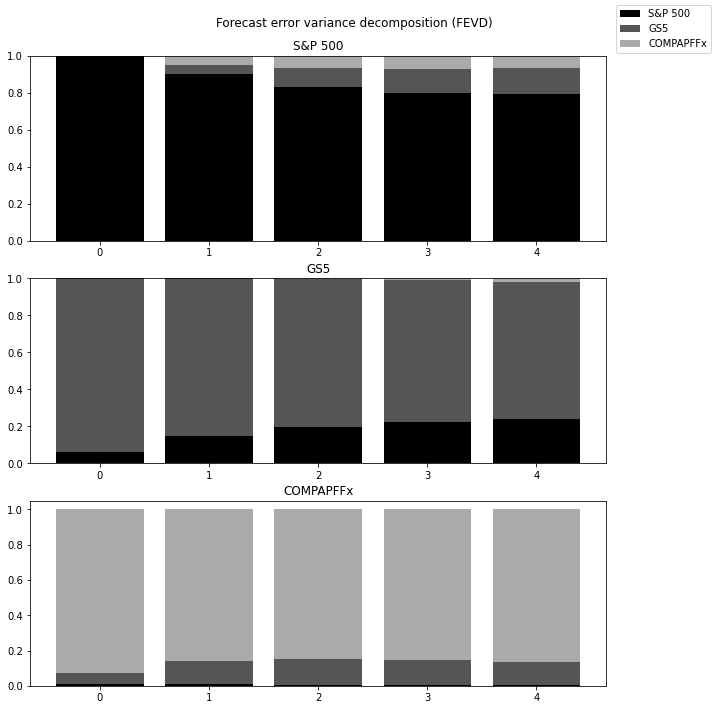

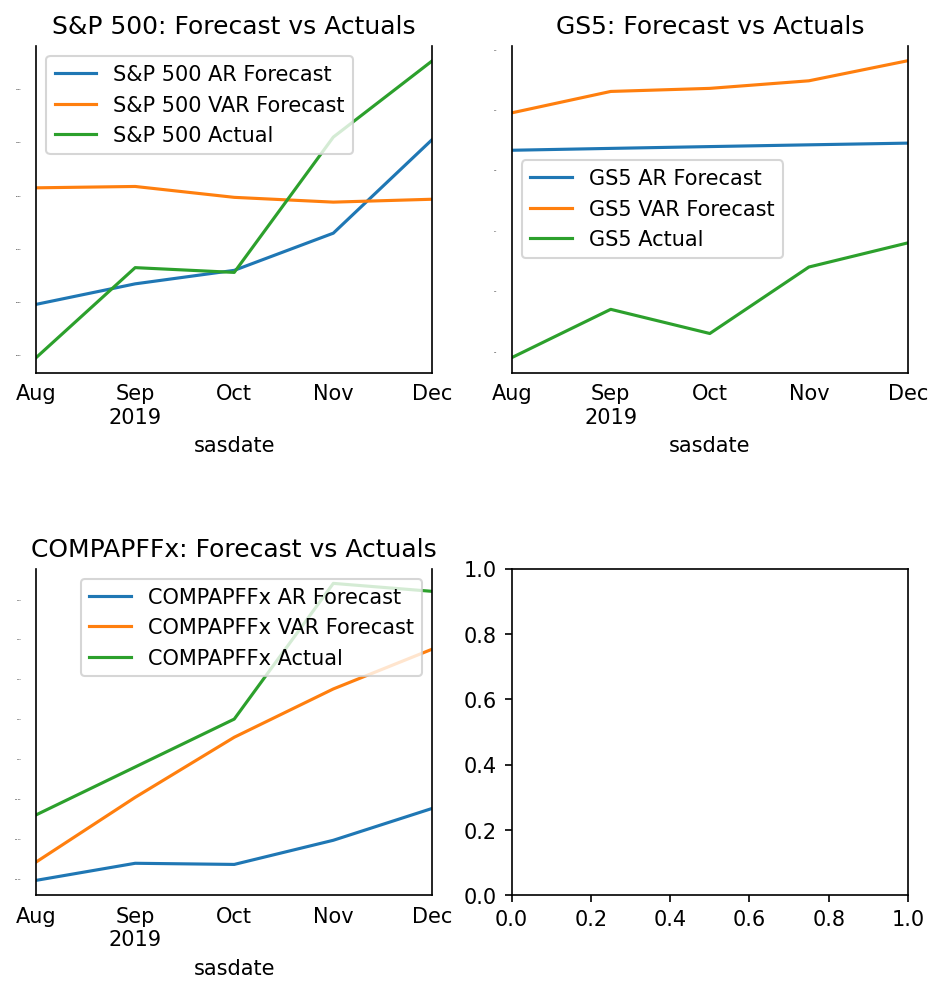

In [64]:
variables = ["S&P 500","GS5", "COMPAPFFx"]
keys = {key: val for key, val in zip(original_data.loc["Transform:"].index,original_data.loc["Transform:"].values) if key in variables}
coin_evaluate_plot(USA[variables],keys,order = 10)

As you can easily see, many data contains seasonality. Thus I expected cointegrated variables perform better.
However, they didn't.
What is clear now is that ["S&P 500","DTCOLNVHFNM", "NONBORRES", "CMRMTSPLx", "INDPRO", "GS5"]　performed better.